# BBU AVG Power Consumption prediction

Predicting the average power consumption of BBUs for three sites (Beta, Delta, Gamma). Each site contains three BBUs: Beta site has B1, B2, and B3; Delta site has D1, D2, and D3; Gamma site has G1, G2, and G3. Four machine learning models are applied: LSTM, CNN-LSTM, CNN-LSTM with hyperoptimizer, and GRU.

This feature is predicted with input from Granular dataset: From 9/6/2024 - 16/6/2024, each 15 minutes.
  - Time Interval [hh:mm]: 15 minutes interval.
  - Day of Week
  - Month

  - Total port Tput [Mbps]: This feature represents the total data transmitted through the port, including both bearer and OAM traffic.
  - UE Tput [kbps]: Reflects the data rate experienced by end-users.

  - UE DlLatency [ms]: Measures network responsiveness for Downlink.
  - eUTRAN Latency [ms]: Overall network latency.

  - UE Packet loss [%]
  - eUTRAN Packet Loss [%] 

  - BBU1 Consumed Energy [Wh]: Essential for analyzing energy efficiency.
  - BBU1 AVG Power consumption [W]: Provides insight into power efficiency.

  - Temp [C] MIN
  - Temp [C] AVG
  - Temp [C] MAX

## Loading libraries

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dropout, Dense, GRU
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os
import random
import tensorflow as tf
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK

## Functions for data preprocessing

In [84]:
def set_seeds(seed=34):
    """
    Set seeds for reproducibility.
    
    Parameters:
    seed (int): Seed value for random number generators.
    """
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'

def load_and_preprocess_data(path, bbu):
    """
    Load and preprocess data from an Excel file.
    
    Parameters:
    path (str): Path to the directory containing the data file.
    bbu (str): BBU identifier to locate the specific data file.
    
    Returns:
    tuple: Preprocessed data and the target column name.
    """
    file_path = f'{path}/{bbu}_granular_updated.xlsx'
    data = pd.read_excel(file_path)
    # Drop columns that start with 'RRU' or contain only NaN values
    data.drop(columns=[col for col in data.columns if col.startswith('RRU') or data[col].isna().all()], inplace=True)
    # Identify the target column
    target_column = next(col for col in data.columns if 'AVG Power consumption' in col)
    # Map day names to numerical values
    data['Day of Week'] = data['Day of Week'].map({
        'Monday': 1, 'Tuesday': 2, 'Wednesday': 3,
        'Thursday': 4, 'Friday': 5, 'Saturday': 6, 'Sunday': 7
    })
    return data, target_column

def create_lagged_features(df, target, lags=10):
    """
    Create lagged features for a given target column.
    
    Parameters:
    df (DataFrame): Input dataframe.
    target (str): Target column name.
    lags (int): Number of lagged features to create.
    
    Returns:
    DataFrame: Dataframe with lagged features.
    """
    for lag in range(1, lags + 1):
        df[f'{target}_lag_{lag}'] = df[target].shift(lag)
    df.dropna(inplace=True)
    return df

def normalize_data(features, target):
    """
    Normalize features and target using MinMaxScaler.
    
    Parameters:
    features (DataFrame): Feature columns.
    target (Series): Target column.
    
    Returns:
    tuple: Scaled features, scaled target, feature scaler, target scaler.
    """
    scaler_features = MinMaxScaler()
    scaled_features = scaler_features.fit_transform(features)
    scaler_target = MinMaxScaler()
    scaled_target = scaler_target.fit_transform(target.values.reshape(-1, 1))
    return scaled_features, scaled_target, scaler_features, scaler_target

def split_data(data, scaled_features, scaled_target):
    """
    Split data into training and testing sets.
    
    Parameters:
    data (DataFrame): Original dataframe.
    scaled_features (ndarray): Scaled feature array.
    scaled_target (ndarray): Scaled target array.
    
    Returns:
    tuple: Training and testing sets for features and target.
    """
    train_size = int(len(data) * 0.7)
    X_train, X_test = scaled_features[:train_size], scaled_features[train_size:]
    y_train, y_test = scaled_target[:train_size], scaled_target[train_size:]
    X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    return X_train, X_test, y_train, y_test

## Functions for different models

In [4]:
def build_model(ML, X_train, params=None):
    model = Sequential()
    if ML == "LSTM":
        model.add(LSTM(50, input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(Dense(50, kernel_initializer='normal', activation='linear'))
        model.add(Dense(30, kernel_initializer='normal', activation='elu'))
        model.add(Dense(15, kernel_initializer='normal', activation='elu'))
        model.add(Dense(1))
    elif ML == "CNN-LSTM":
        model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(MaxPooling1D(pool_size=1))
        model.add(LSTM(50, activation='relu'))
        model.add(Dropout(0.2))
        model.add(Dense(1))
    elif ML == "GRU":
        model.add(GRU(50, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(Dropout(0.2))
        model.add(Dense(1))
    elif ML == "CNN-LSTM-hyperoptimizer" and params:
        model.add(Conv1D(filters=int(params['filters']), kernel_size=(int(params['kernel_size']),), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2])))
        model.add(MaxPooling1D(pool_size=(int(params['pool_size']),)))
        model.add(LSTM(int(params['lstm_units']), activation=params['activation']))
        model.add(Dropout(params['dropout']))
        model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=params['learning_rate'] if params else 0.001), loss='mae')
    return model

def objective(params, X_train, y_train, X_test, y_test):
    print(f"Testing with parameters: {params}")
    model = build_model("CNN-LSTM-hyperoptimizer", X_train, params)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)
    history = model.fit(X_train, y_train, epochs=50, batch_size=int(params['batch_size']), validation_data=(X_test, y_test), verbose=0, shuffle=False, callbacks=[early_stopping, reduce_lr])
    val_loss = min(history.history['val_loss'])
    return {'loss': val_loss, 'status': STATUS_OK}

def hyperopt_optimization(X_train, y_train, X_test, y_test):
    search_space = {
        'filters': hp.choice('filters', [16, 32, 64]),
        'kernel_size': hp.choice('kernel_size', [1]),
        'pool_size': hp.choice('pool_size', [1]),
        'lstm_units': hp.choice('lstm_units', [50, 100, 150]),
        'activation': hp.choice('activation', ['relu', 'tanh']),
        'dropout': hp.uniform('dropout', 0.2, 0.5),
        'learning_rate': hp.uniform('learning_rate', 0.0001, 0.01),
        'batch_size': hp.choice('batch_size', [16, 32, 64])
    }
    trials = Trials()
    rng = np.random.default_rng(42)
    best_params = fmin(fn=lambda params: objective(params, X_train, y_train, X_test, y_test), space=search_space, algo=tpe.suggest, max_evals=50, trials=trials, rstate=rng)
    best_params['filters'] = [16, 32, 64][best_params['filters']]
    best_params['kernel_size'] = [1][best_params['kernel_size']]
    best_params['pool_size'] = [1][best_params['pool_size']]
    best_params['lstm_units'] = [50, 100, 150][best_params['lstm_units']]
    best_params['activation'] = ['relu', 'tanh'][best_params['activation']]
    best_params['batch_size'] = [16, 32, 64][best_params['batch_size']]
    return best_params

## Functions for showing the results

In [5]:
def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, scaler_target, path, bbu, ML):
    # Set up early stopping and learning rate reduction callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.2, min_lr=1e-6)
    
    # Train the model
    history = model.fit(X_train, y_train, epochs=100, batch_size=16, validation_data=(X_test, y_test), callbacks=[early_stopping, reduce_lr])
    
    # Create output directory if it doesn't exist
    output_dir = f'{path}/{ML}'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Make predictions on train and test data
    train_predictions_scaled = model.predict(X_train)
    test_predictions_scaled = model.predict(X_test)
    
    # Inverse transform the predictions and actual values
    train_predictions = scaler_target.inverse_transform(train_predictions_scaled)
    y_train_inverse = scaler_target.inverse_transform(y_train)
    test_predictions = scaler_target.inverse_transform(test_predictions_scaled)
    y_test_inverse = scaler_target.inverse_transform(y_test)
    
    # Calculate MAE and MAPE for train and test data
    train_mae = mean_absolute_error(y_train_inverse, train_predictions)
    train_mape = mean_absolute_percentage_error(y_train_inverse, train_predictions) * 100
    test_mae = mean_absolute_error(y_test_inverse, test_predictions)
    test_mape = mean_absolute_percentage_error(y_test_inverse, test_predictions) * 100
    
    # Print the results
    print(f"Train MAE: {train_mae}, Train MAPE: {train_mape}%")
    print(f"Test MAE: {test_mae}, Test MAPE: {test_mape}%")
    
    # Save the results to a file
    results_filepath = os.path.join(output_dir, f'{bbu}_results.txt')
    with open(results_filepath, 'w') as file:
        file.write(f"Train MAE: {train_mae}, Train MAPE: {train_mape}%\n")
        file.write(f"Test MAE: {test_mae}, Test MAPE: {test_mape}%\n")
    
    return history, test_predictions, y_test_inverse

def plot_results(history, data, y_test_inverse, test_predictions, path, bbu, ML, target_column):
    # Create output directory if it doesn't exist
    output_dir = f'{path}/{ML}'
    
    # Set plot parameters
    plt.rcParams.update({
        'font.size': 14,
        'axes.titlesize': 18,
        'axes.labelsize': 16,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 14,
    })
    
    # Plot training and validation loss
    plt.figure(figsize=(6, 4))
    plt.plot(history.history['loss'], label='Train MAE Loss')
    plt.plot(history.history['val_loss'], label='Validation MAE Loss')
    plt.title('MAE Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{bbu}_mae_loss.png'), bbox_inches='tight')
    plt.show()
    
    # Plot actual vs predicted consumption
    plt.figure(figsize=(10, 6))
    datetime_index = data['Datetime'].iloc[-len(y_test_inverse):]
    plt.plot(datetime_index, y_test_inverse, label='Actual Consumption', color='#1f77b4')
    plt.plot(datetime_index, test_predictions, label='Predicted Consumption', linestyle='-.', color='orange')
    
    # Add vertical lines for midnight
    midnight_added = False
    for i, xc in enumerate(datetime_index):
        if xc.hour == 0 and xc.minute == 0:
            plt.axvline(x=xc, color='black', linestyle='--', alpha=0.5, lw=1, label='Midnight' if not midnight_added else "")
            midnight_added = True
    
    plt.legend()
    plt.title(f'BBU AVG Power Consumption Prediction in {bbu} using {ML}')
    plt.xlabel('Datetime')
    plt.ylabel('BBU AVG Power Consumption [W]')
    plt.xticks(rotation=45)
    plt.xlim(datetime_index.min(), datetime_index.max())
    plt.grid(False)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{bbu}_predict_vs_actual.png'), bbox_inches='tight')
    plt.show()
    
    # Save predictions and actual values to a CSV file
    data_to_save = pd.DataFrame({
        'Datetime': datetime_index,
        'Predict data': test_predictions.flatten(),
        'Actual data': y_test_inverse.flatten()
    })
    data_to_save.to_csv(f'{output_dir}/{bbu}_{target_column}_predictions_vs_actuals.csv', index=False)

def plot_daily_predictions(y_test_rescaled, predicted_rescaled, date, bbu, path, ML):
    output_dir = f'{path}/{ML}'
    # Define the start and end of the day
    start_date = pd.Timestamp(date.year, date.month, date.day, 0)
    end_date = start_date + pd.Timedelta(hours=23)
    date_range = pd.date_range(start=start_date, end=end_date, freq='H')
    
    # Plot actual vs predicted consumption for a single day
    plt.figure(figsize=(8, 5))
    plt.plot(y_test_rescaled[start_date:end_date].index, y_test_rescaled[start_date:end_date], label='Actual', color='#1f77b4')
    plt.plot(predicted_rescaled[start_date:end_date].index, predicted_rescaled[start_date:end_date], label='Predicted', linestyle='-.', color='orange')
    plt.legend()
    plt.title(f'BBU AVG Power Consumption Prediction in {bbu} on {date}')
    plt.xlabel('Hour')
    plt.ylabel('BBU AVG Power Consumption [W]')
    plt.xticks(date_range, [f'{dt.hour}:00' for dt in date_range], rotation=45)
    plt.xlim(start_date, end_date)
    
    # Add vertical lines for each hour
    for xc in date_range:
        plt.axvline(x=xc, color='black', linestyle='--', alpha=0.3, lw=1)
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{bbu}_daily_predict_vs_actual.png'), bbox_inches='tight')
    plt.show()

def model_perform(path, bbus, ML):
    # Set random seeds for reproducibility
    set_seeds()
    
    for bbu in bbus:
        # Load and preprocess data
        data, target_column = load_and_preprocess_data(path, bbu)
        data = create_lagged_features(data, target_column, lags=10)
        
        # Extract features and target
        features = data.drop(columns=[target_column, 'Datetime']).select_dtypes(include=[np.number])
        target = data[target_column]
        
        # Normalize data
        scaled_features, scaled_target, scaler_features, scaler_target = normalize_data(features, target)
        
        # Split data into training and testing sets
        X_train, X_test, y_train, y_test = split_data(data, scaled_features, scaled_target)
        
        # Build and train the model
        if ML == "CNN-LSTM-hyperoptimizer":
            best_params = hyperopt_optimization(X_train, y_train, X_test, y_test)
            model = build_model(ML, X_train, best_params)
        else:
            model = build_model(ML, X_train)
        
        # Train and evaluate the model
        history, test_predictions, y_test_inverse = train_and_evaluate_model(model, X_train, y_train, X_test, y_test, scaler_target, path, bbu, ML)
        
        # Plot results
        plot_results(history, data, y_test_inverse, test_predictions, path, bbu, ML, target_column)
        
        # Rescale predictions and actual values
        y_test_rescaled_series = pd.Series(y_test_inverse.flatten(), index=data['Datetime'].iloc[-len(y_test):])
        predicted_rescaled_series = pd.Series(test_predictions.flatten(), index=data['Datetime'].iloc[-len(y_test):])
        
        # Plot daily predictions for a random day
        random_day = y_test_rescaled_series.index.date[115]
        plot_daily_predictions(y_test_rescaled_series, predicted_rescaled_series, random_day, bbu, path, ML)

## Results of BBU AVG Power Consumption for Beta Site (B1, B2, B3)

### Result of B1

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3281 - val_loss: 0.1172 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0938 - val_loss: 0.0568 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0566 - val_loss: 0.0597 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0504 - val_loss: 0.0565 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0479 - val_loss: 0.0515 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0473 - val_loss: 0.0473 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0422 - val_loss: 0.0479 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0411 - val_loss: 0.0472 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0395 - val_loss: 0.0491 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

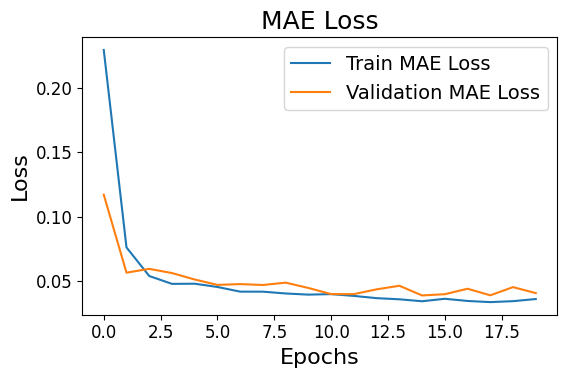

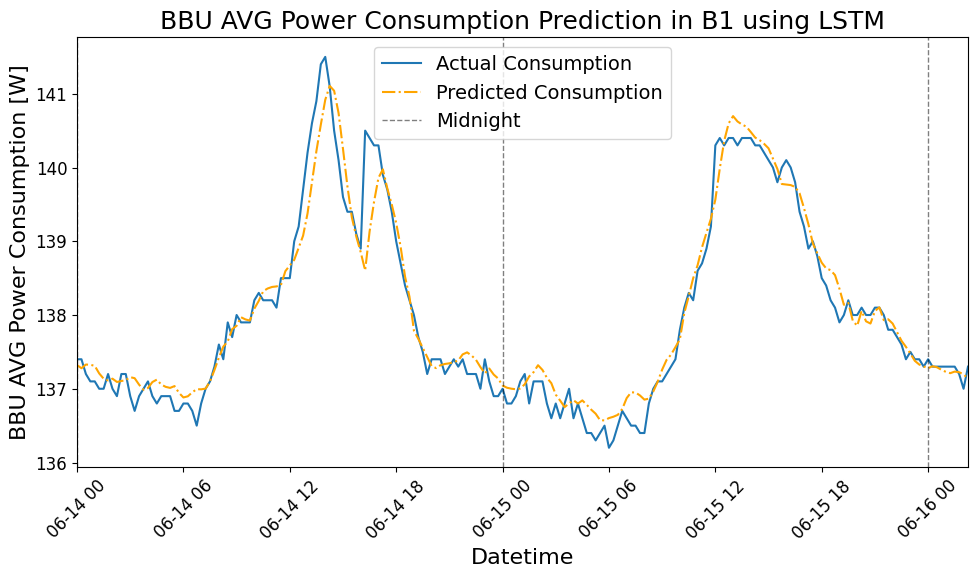

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


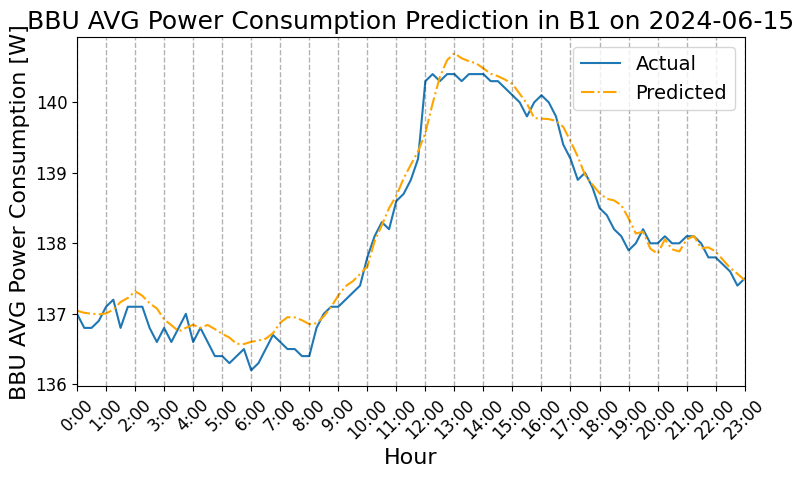

In [20]:
model_perform("beta", ["B1"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3419 - val_loss: 0.0887 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0952 - val_loss: 0.0711 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0789 - val_loss: 0.0613 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0752 - val_loss: 0.0633 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0775 - val_loss: 0.0574 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0636 - val_loss: 0.0548 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0581 - val_loss: 0.0542 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0611 - val_loss: 0.0518 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0630 - val_loss: 0.0497 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

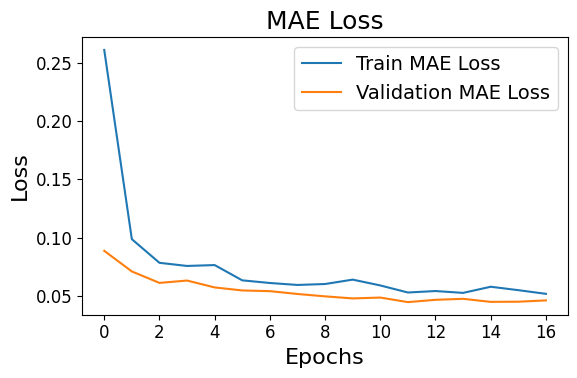

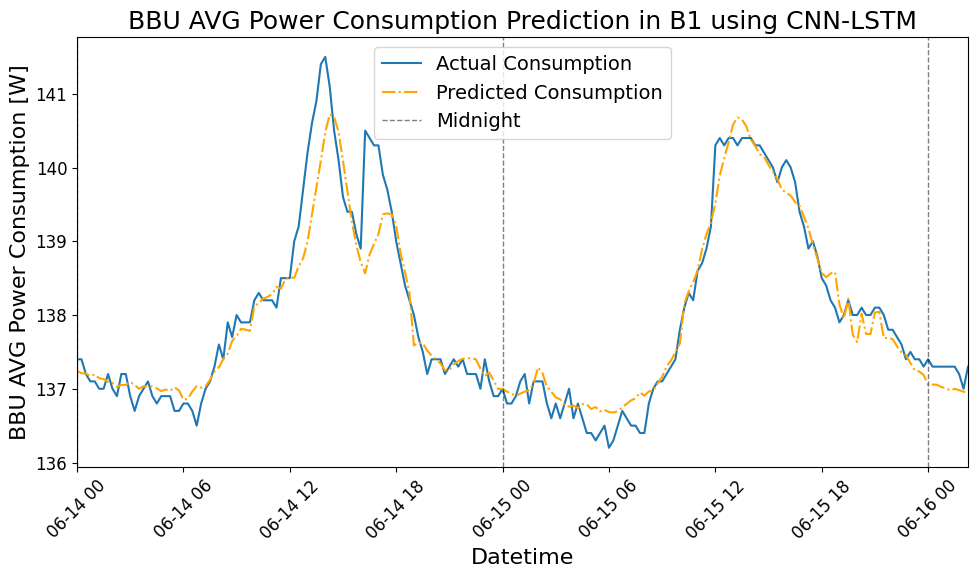

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


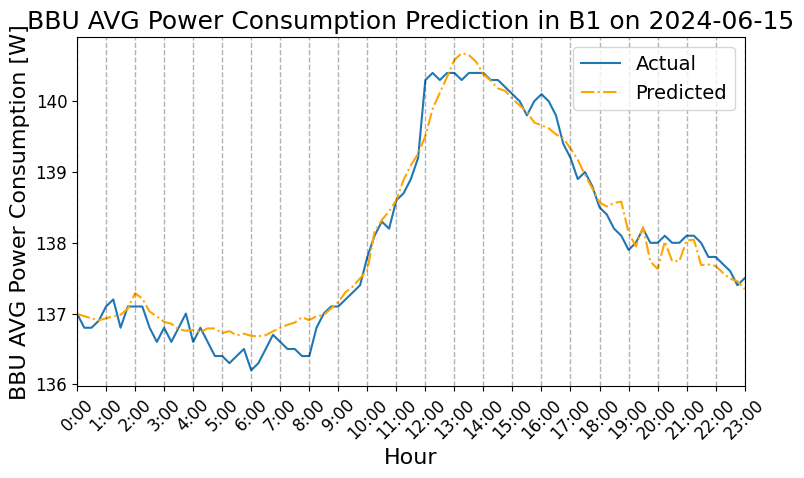

In [13]:
model_perform("beta", ["B1"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

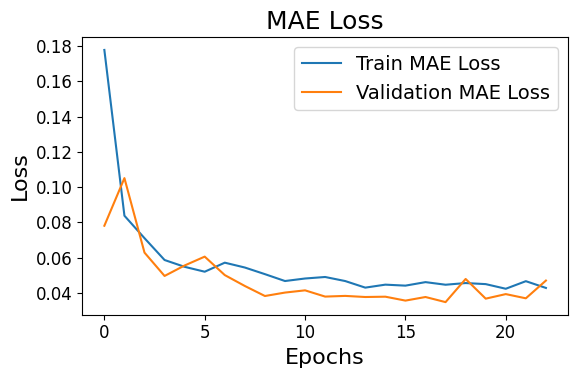

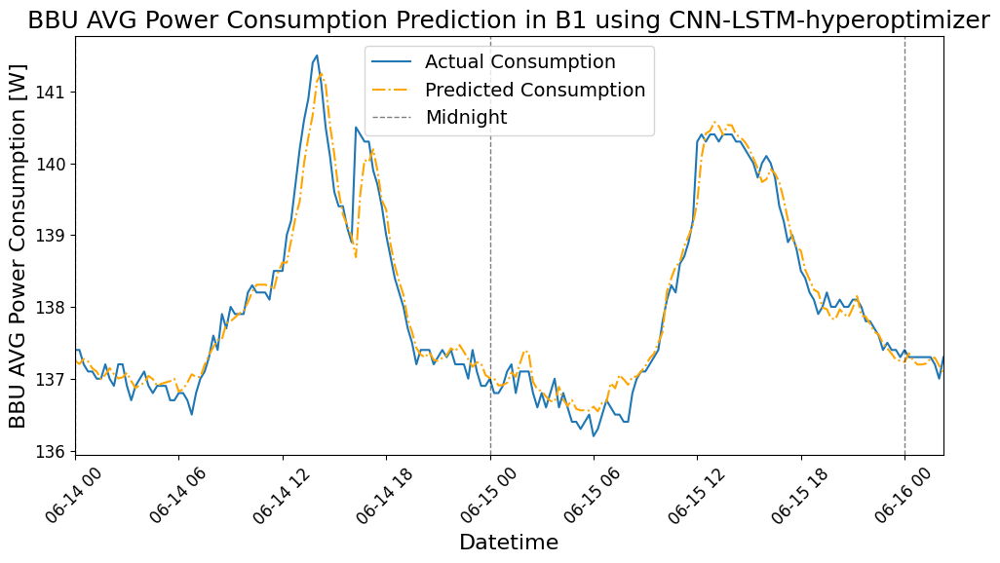

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


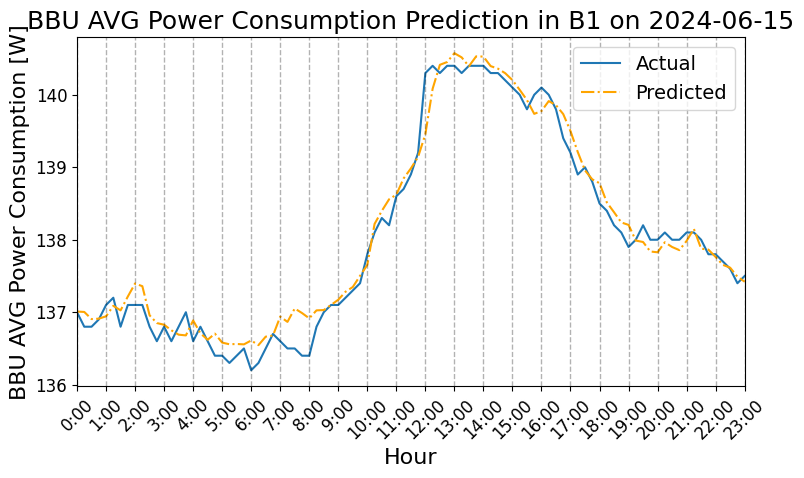

In [18]:
model_perform("beta", ["B1"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3321 - val_loss: 0.1192 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0965 - val_loss: 0.0815 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0790 - val_loss: 0.0642 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0760 - val_loss: 0.0626 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0757 - val_loss: 0.0679 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0746 - val_loss: 0.0643 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0654 - val_loss: 0.0520 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0676 - val_loss: 0.0577 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0602 - val_loss: 0.0510 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

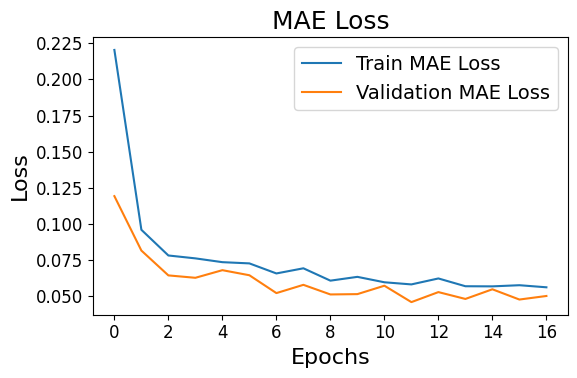

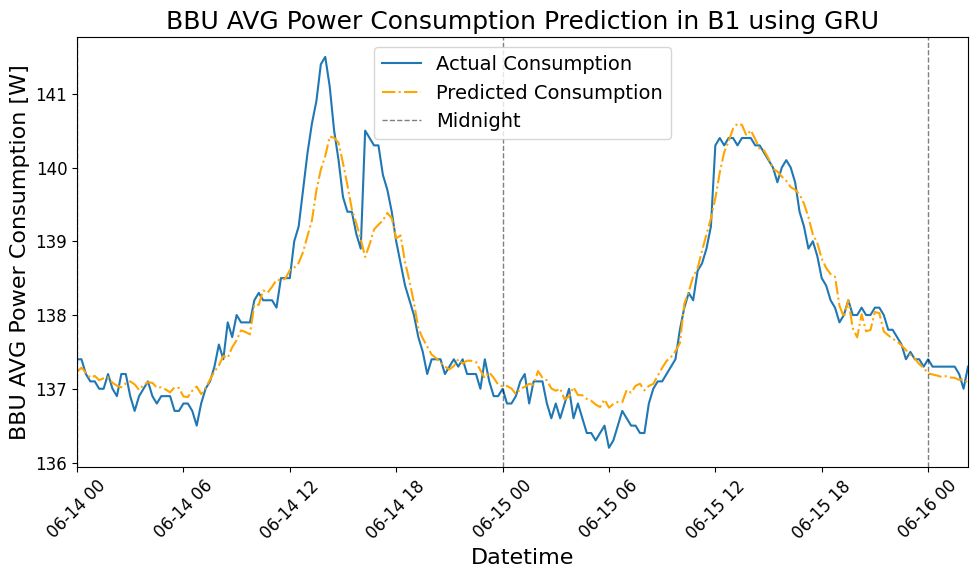

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


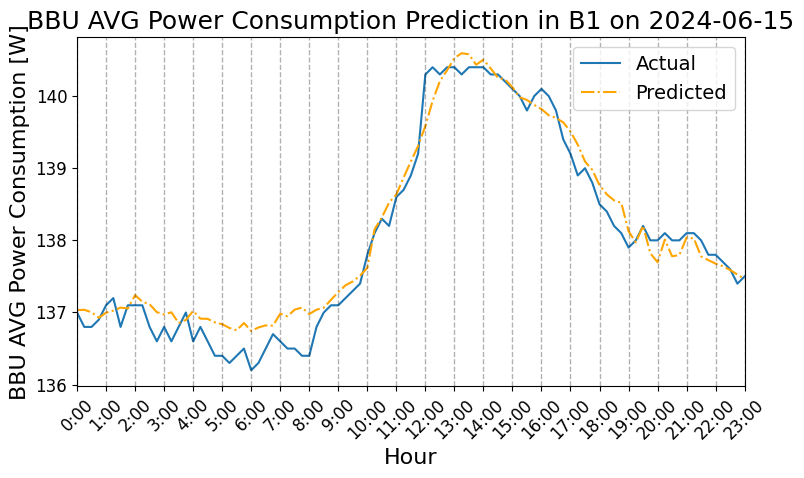

In [10]:
model_perform("beta", ["B1"], "GRU")

### Result of B2

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1711 - val_loss: 0.0378 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0582 - val_loss: 0.0338 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0447 - val_loss: 0.0311 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0315 - val_loss: 0.0213 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0263 - val_loss: 0.0197 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0234 - val_loss: 0.0192 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0249 - val_loss: 0.0207 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0236 - val_loss: 0.0197 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0229 - val_loss: 0.0221 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

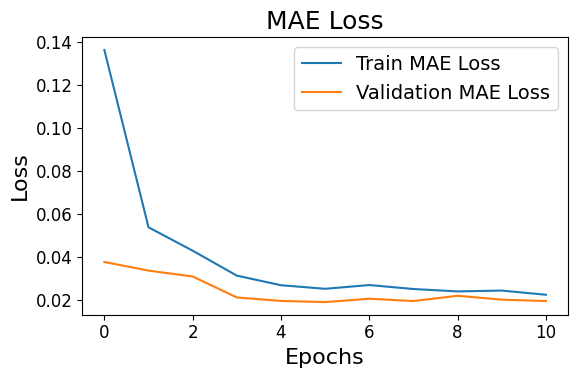

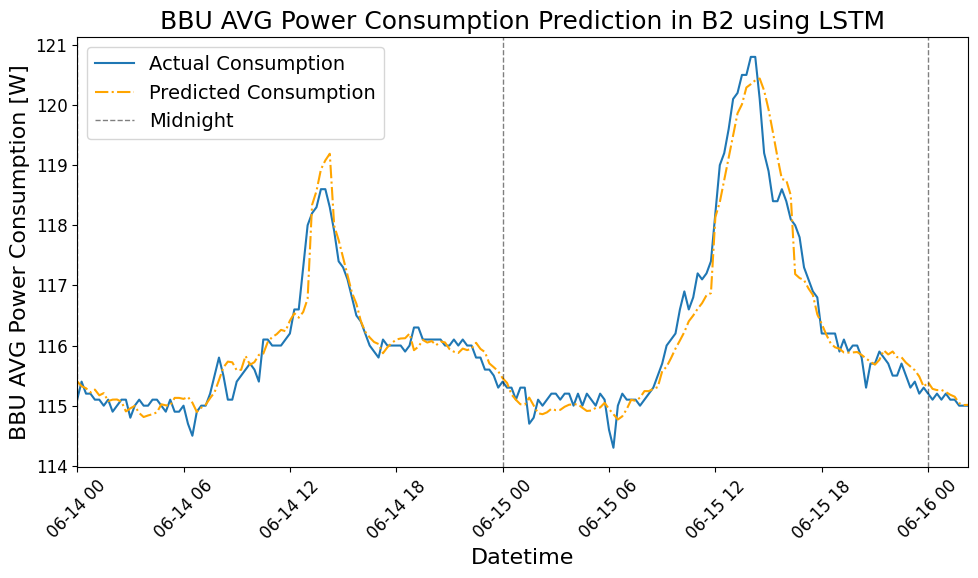

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


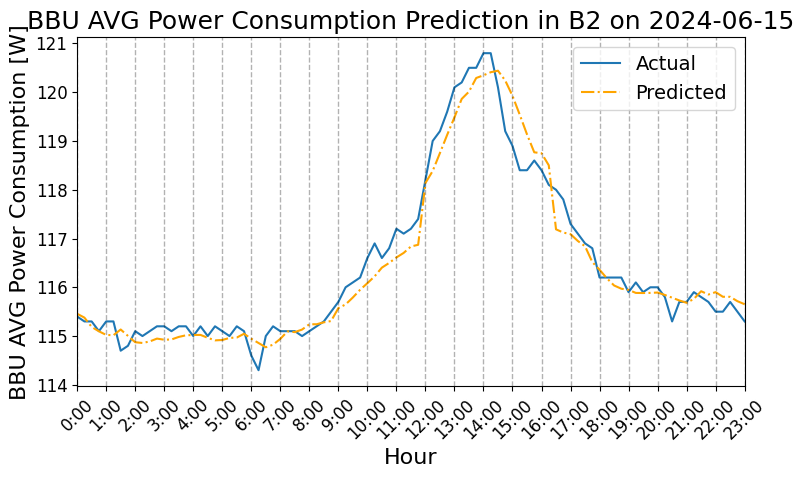

In [21]:
model_perform("beta", ["B2"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1554 - val_loss: 0.0701 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0617 - val_loss: 0.0318 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0494 - val_loss: 0.0272 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0441 - val_loss: 0.0263 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0390 - val_loss: 0.0231 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0402 - val_loss: 0.0229 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361 - val_loss: 0.0244 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0362 - val_loss: 0.0208 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0352 - val_loss: 0.0209 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

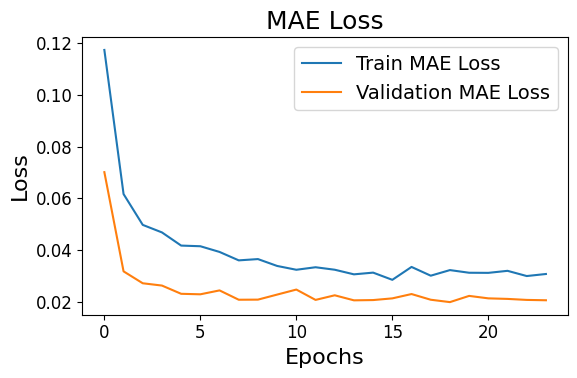

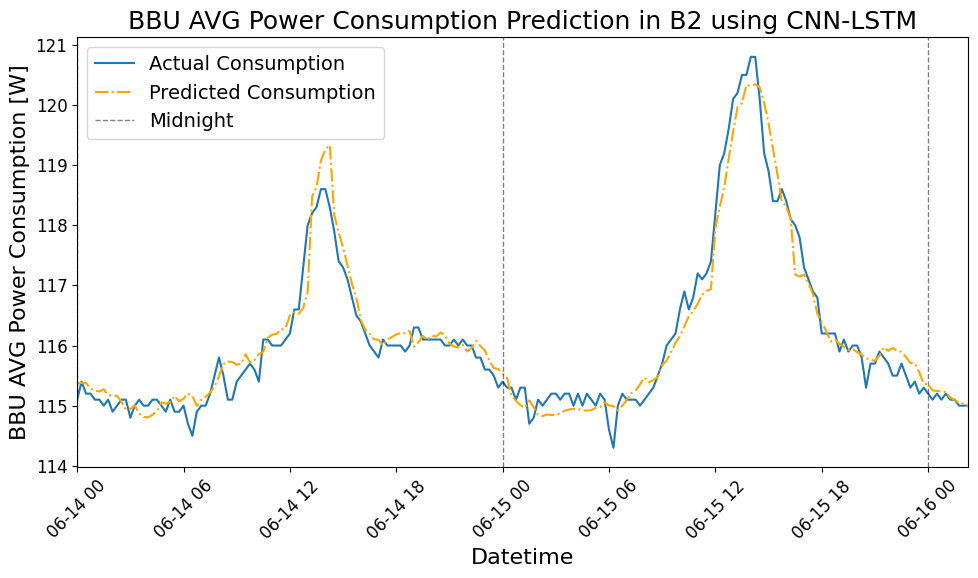

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


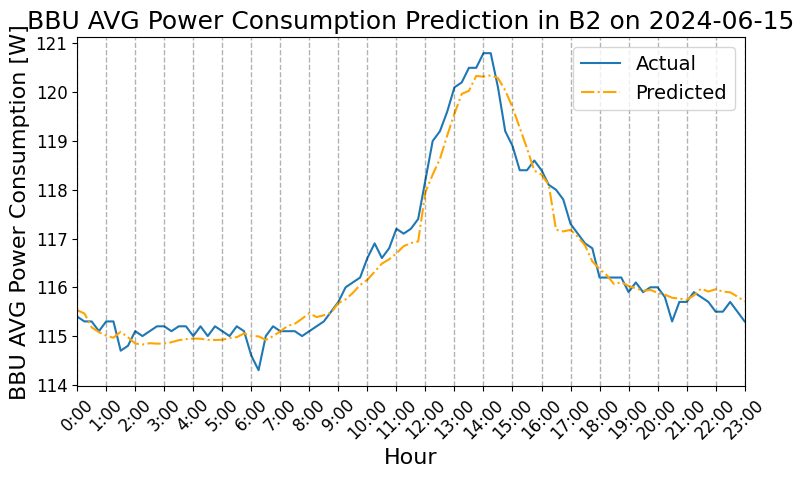

In [22]:
model_perform("beta", ["B2"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

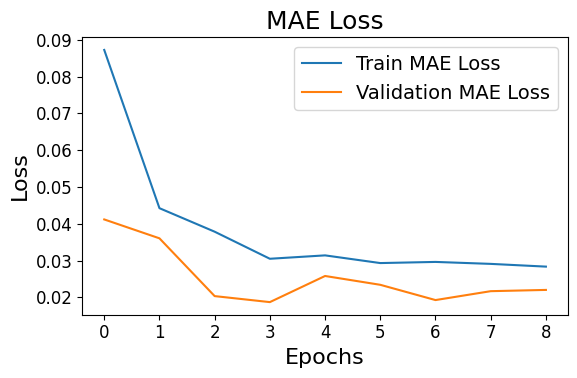

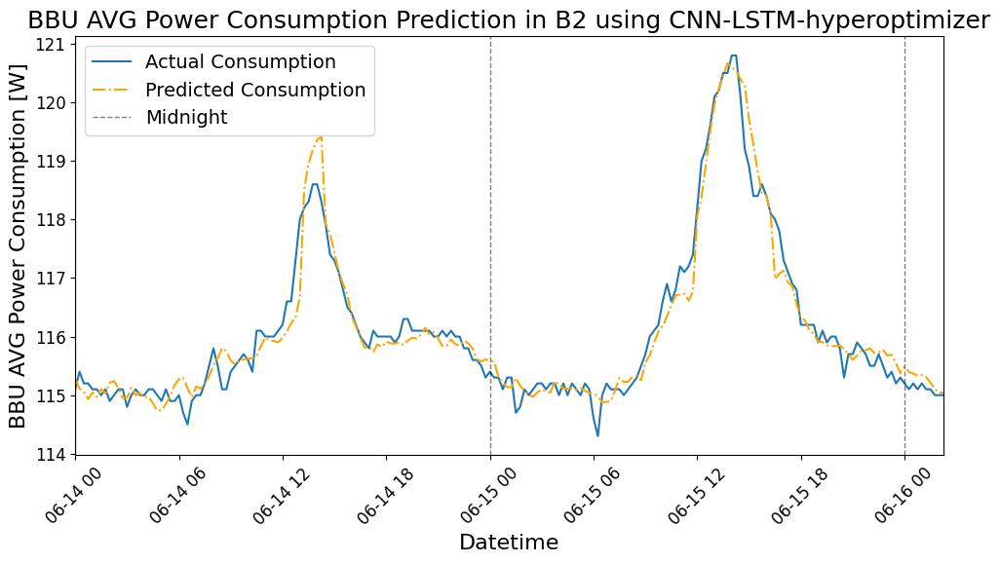

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


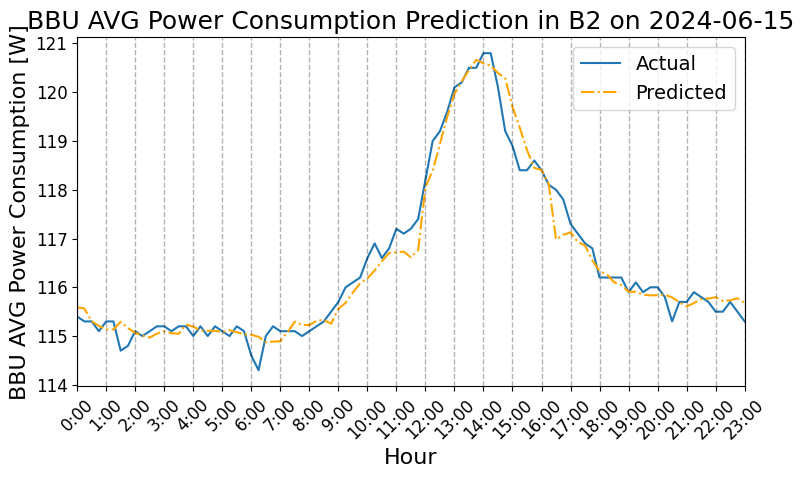

In [28]:
model_perform("beta", ["B2"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2007 - val_loss: 0.0784 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0687 - val_loss: 0.0335 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0551 - val_loss: 0.0271 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0475 - val_loss: 0.0269 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0457 - val_loss: 0.0241 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0436 - val_loss: 0.0217 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0390 - val_loss: 0.0207 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0355 - val_loss: 0.0212 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0374 - val_loss: 0.0207 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

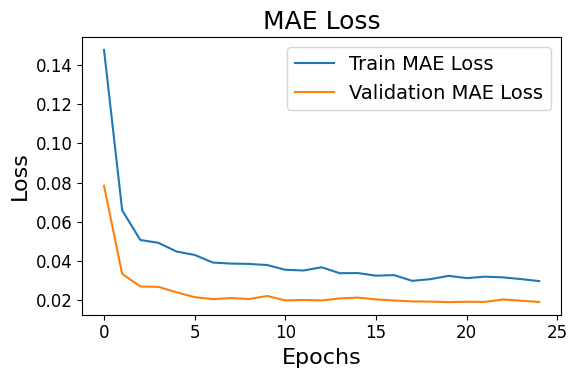

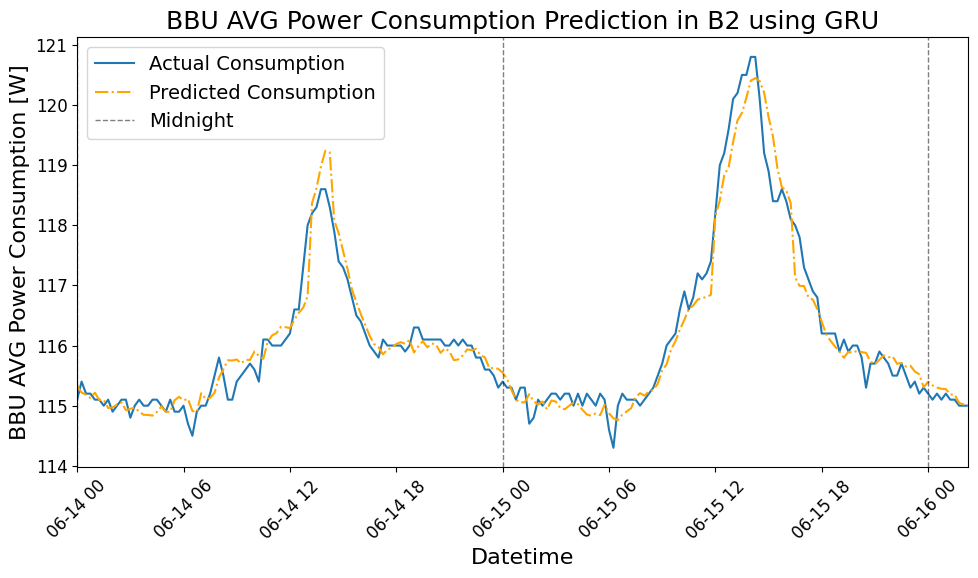

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


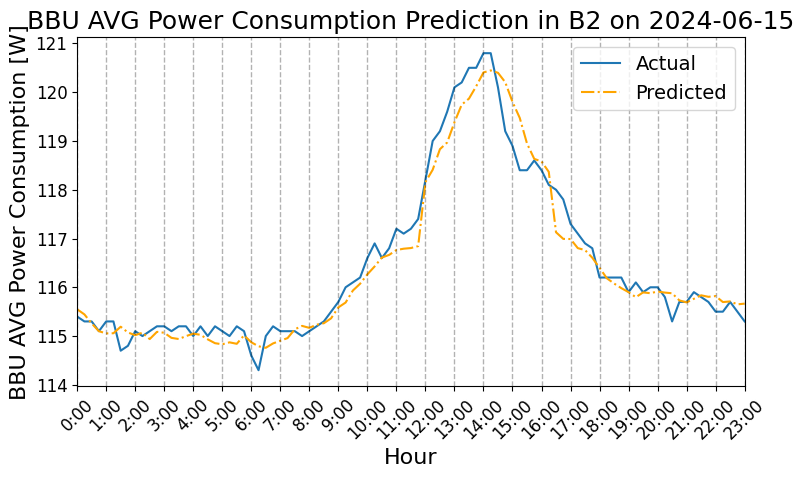

In [24]:
model_perform("beta", ["B2"], "GRU")

### Result of B3

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2093 - val_loss: 0.0562 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1024 - val_loss: 0.0436 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0547 - val_loss: 0.0479 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0465 - val_loss: 0.0347 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0345 - val_loss: 0.0312 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0256 - val_loss: 0.0230 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0213 - val_loss: 0.0258 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0219 - val_loss: 0.0232 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0212 - val_loss: 0.0277 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

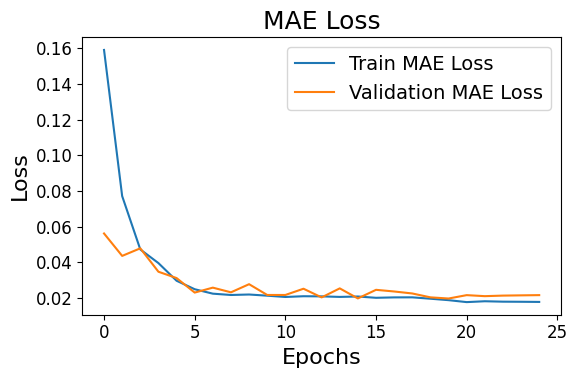

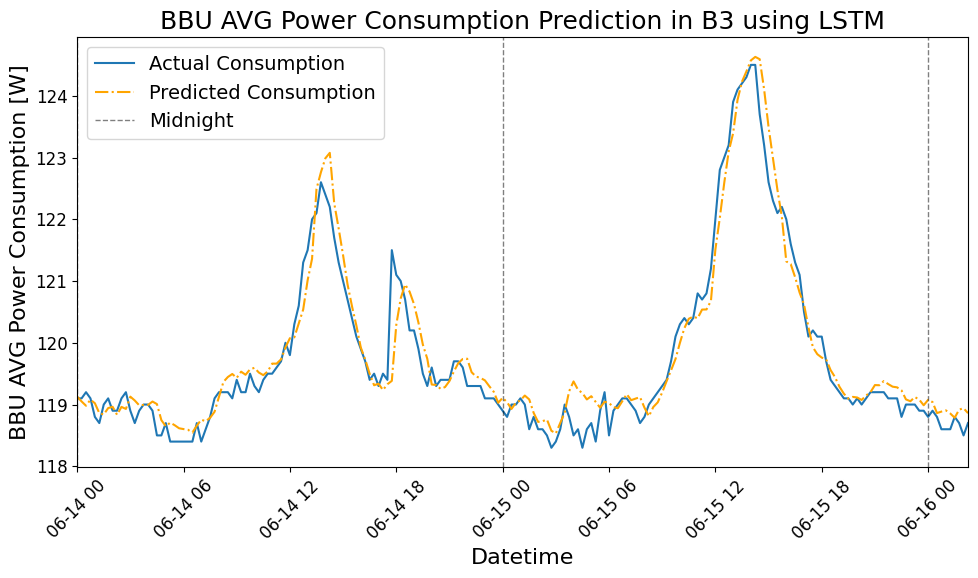

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


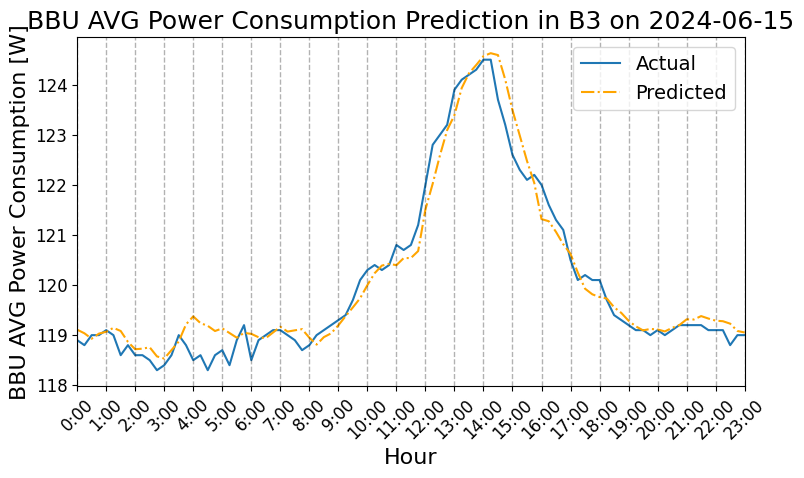

In [34]:
model_perform("beta", ["B3"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2021 - val_loss: 0.0679 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0727 - val_loss: 0.0377 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0533 - val_loss: 0.0324 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0530 - val_loss: 0.0305 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0442 - val_loss: 0.0280 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0414 - val_loss: 0.0263 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0350 - val_loss: 0.0258 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367 - val_loss: 0.0257 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0338 - val_loss: 0.0310 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

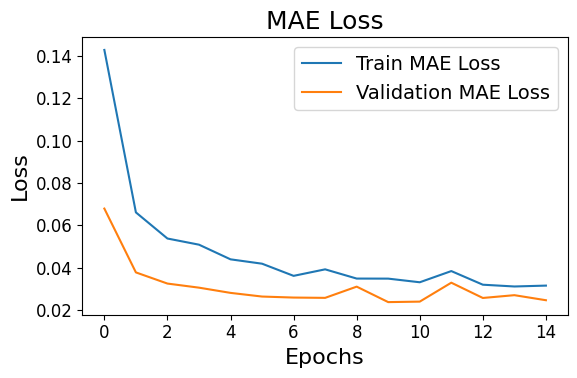

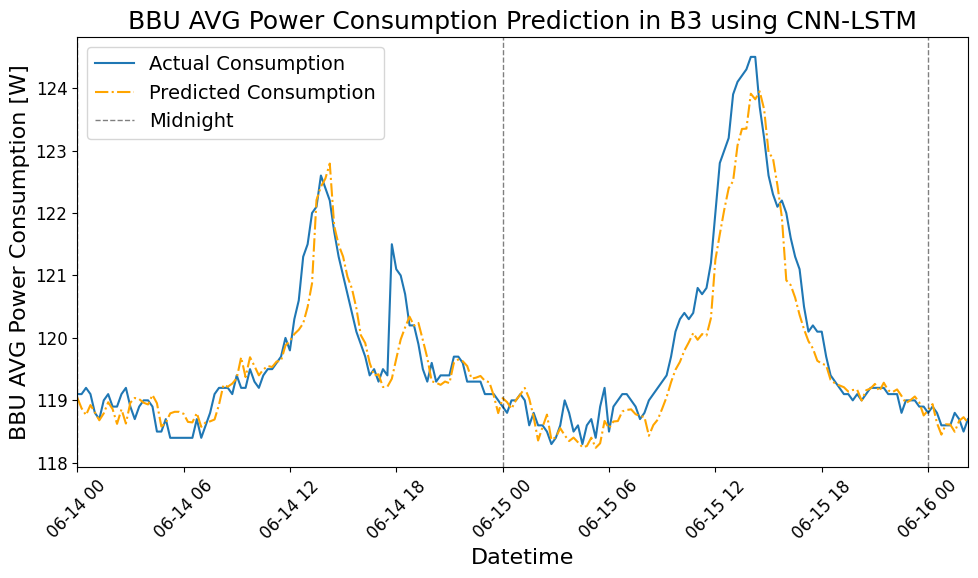

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


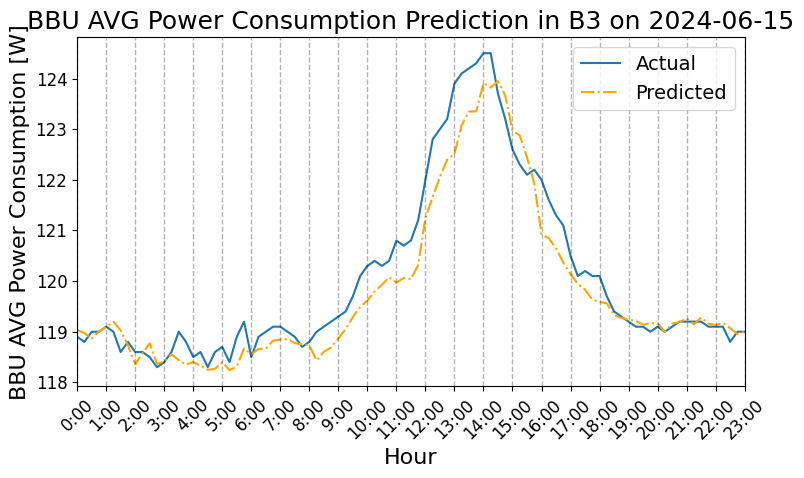

In [30]:
model_perform("beta", ["B3"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

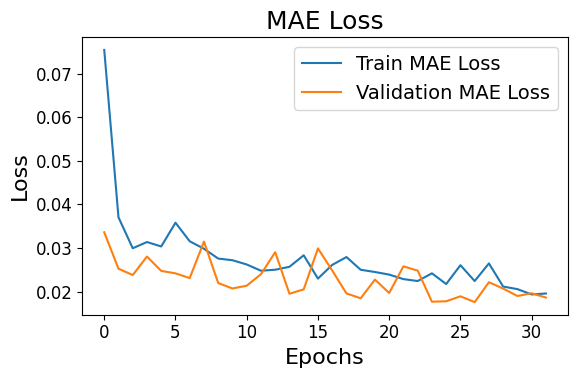

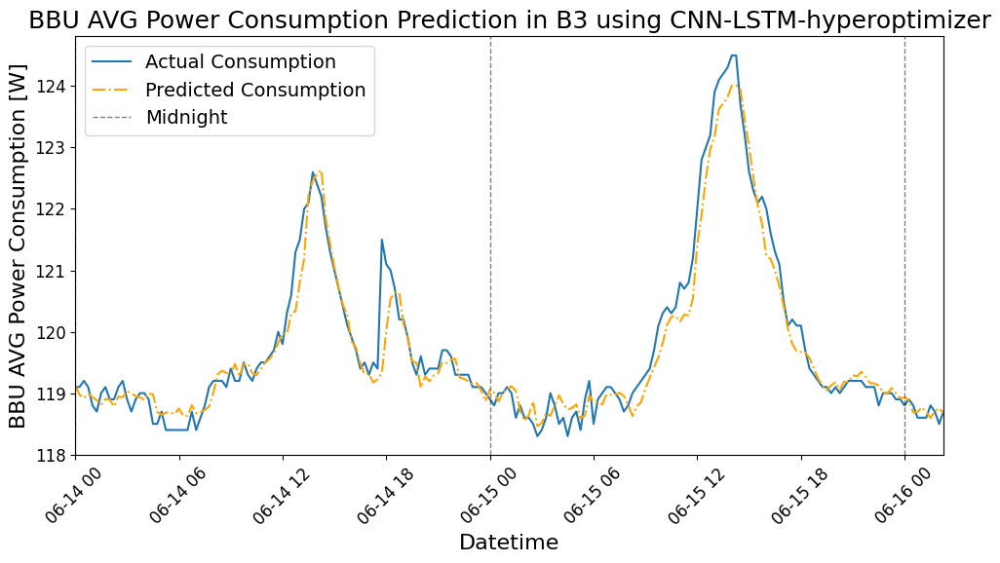

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


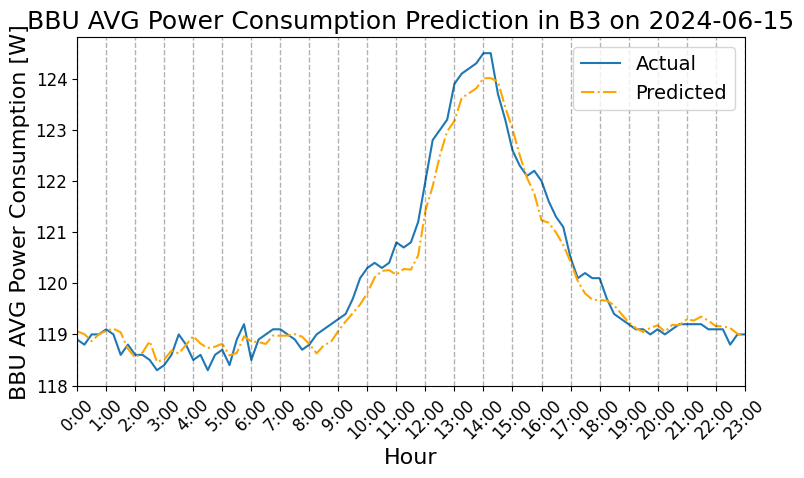

In [35]:
model_perform("beta", ["B3"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2234 - val_loss: 0.0980 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0918 - val_loss: 0.0409 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0529 - val_loss: 0.0329 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0470 - val_loss: 0.0304 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0453 - val_loss: 0.0283 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0358 - val_loss: 0.0280 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0385 - val_loss: 0.0300 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0371 - val_loss: 0.0236 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0370 - val_loss: 0.0229 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

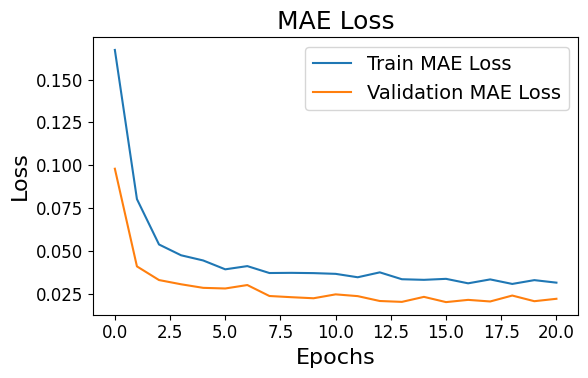

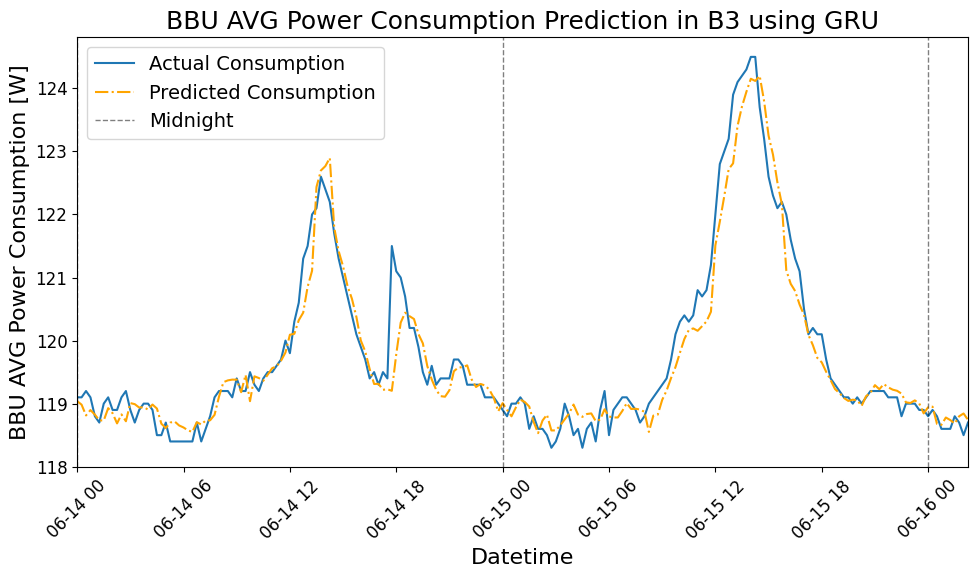

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


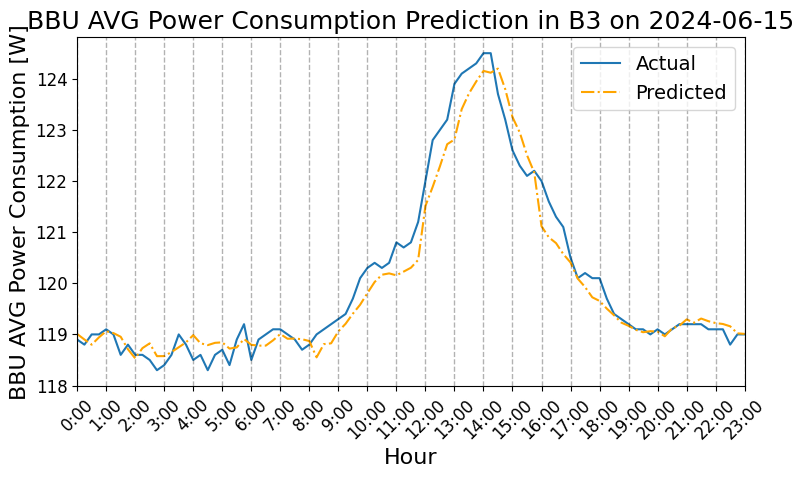

In [32]:
model_perform("beta", ["B3"], "GRU")

## Results of BBU AVG Power Consumption for Delta Site (D1, D2, D3)

### Result of D1

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1452 - val_loss: 0.2671 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0588 - val_loss: 0.2448 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0522 - val_loss: 0.2213 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0489 - val_loss: 0.2036 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0463 - val_loss: 0.1886 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0435 - val_loss: 0.1873 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0432 - val_loss: 0.1676 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0394 - val_loss: 0.1512 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0375 - val_loss: 0.1567 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

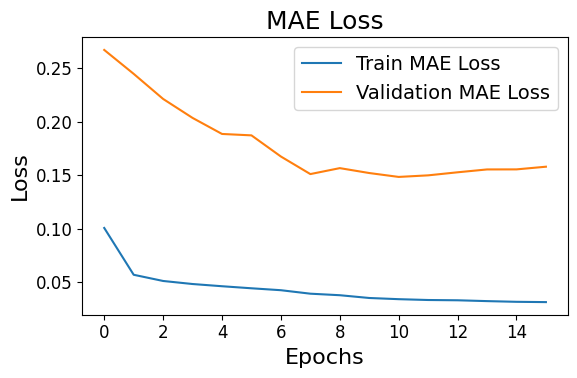

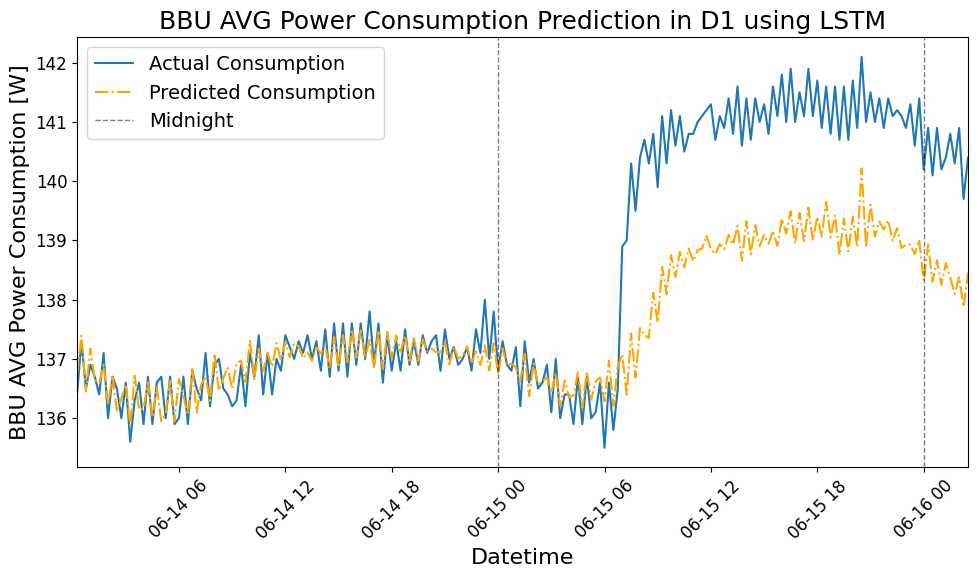

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


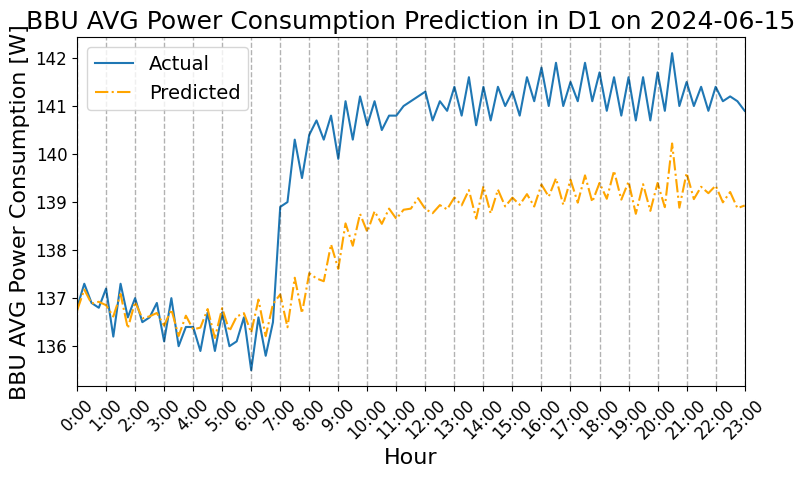

In [44]:
model_perform("delta", ["D1"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1259 - val_loss: 0.1968 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0564 - val_loss: 0.2014 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0516 - val_loss: 0.1950 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0479 - val_loss: 0.1915 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0441 - val_loss: 0.1636 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0445 - val_loss: 0.1646 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0394 - val_loss: 0.1742 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0422 - val_loss: 0.1614 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0379 - val_loss: 0.1871 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

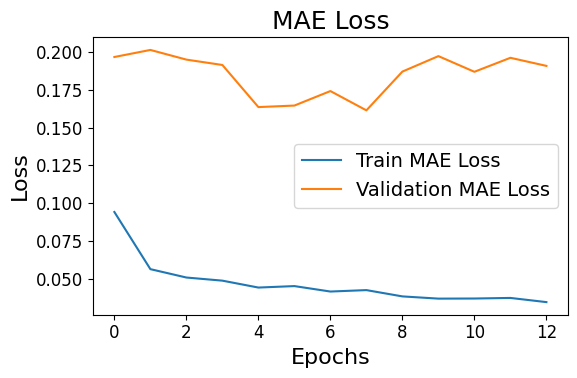

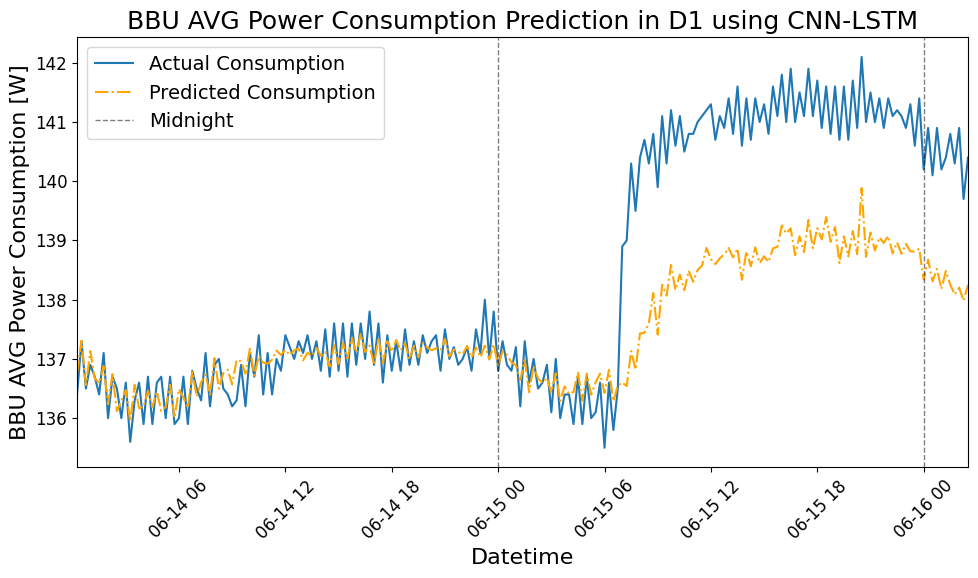

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


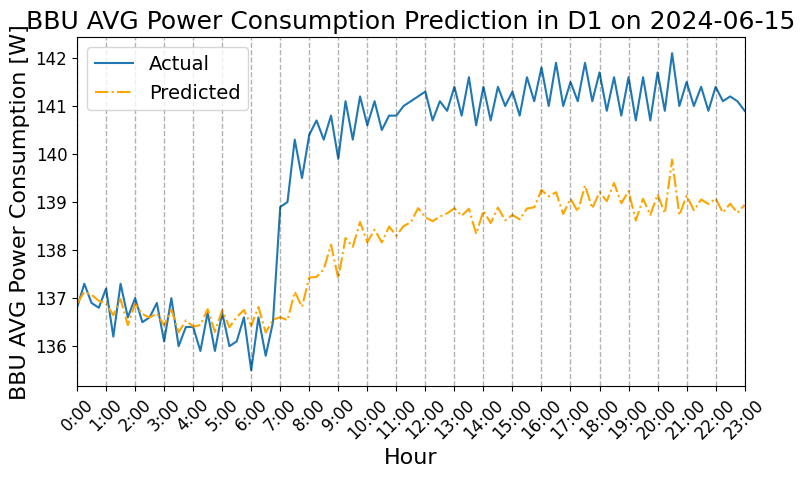

In [42]:
model_perform("delta", ["D1"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

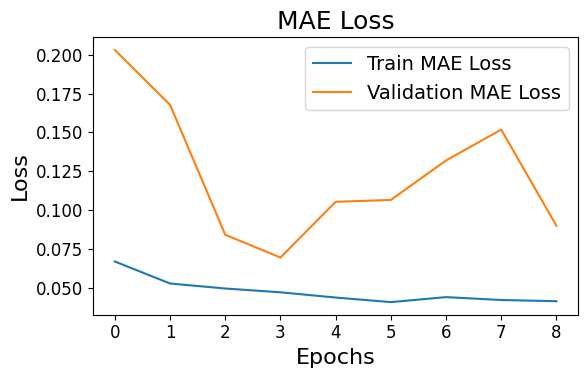

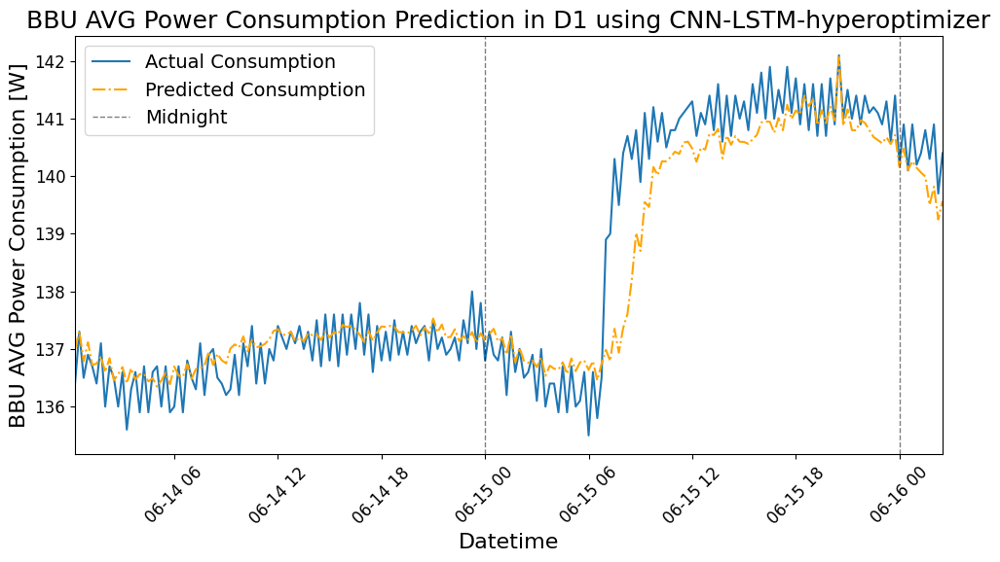

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


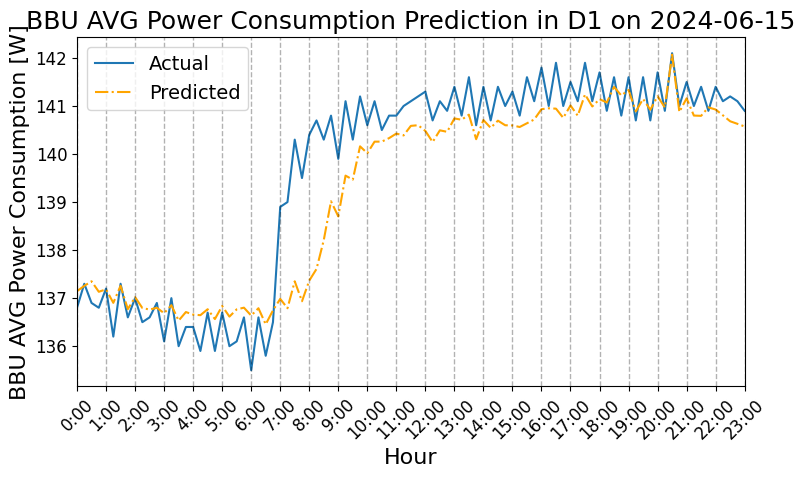

In [46]:
model_perform("delta", ["D1"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.1838 - val_loss: 0.1877 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0712 - val_loss: 0.1964 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0644 - val_loss: 0.2011 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0634 - val_loss: 0.1962 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0562 - val_loss: 0.2178 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0567 - val_loss: 0.2196 - learning_rate: 0.0010
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 450us/step
Train MAE: 0.34979520826076427, Train MAPE: 0.2555106358537461%
Test MAE: 1.2386222008431307, Test MAPE: 0.8836513431666477%


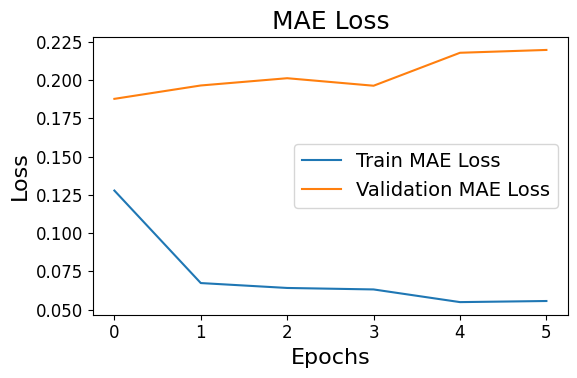

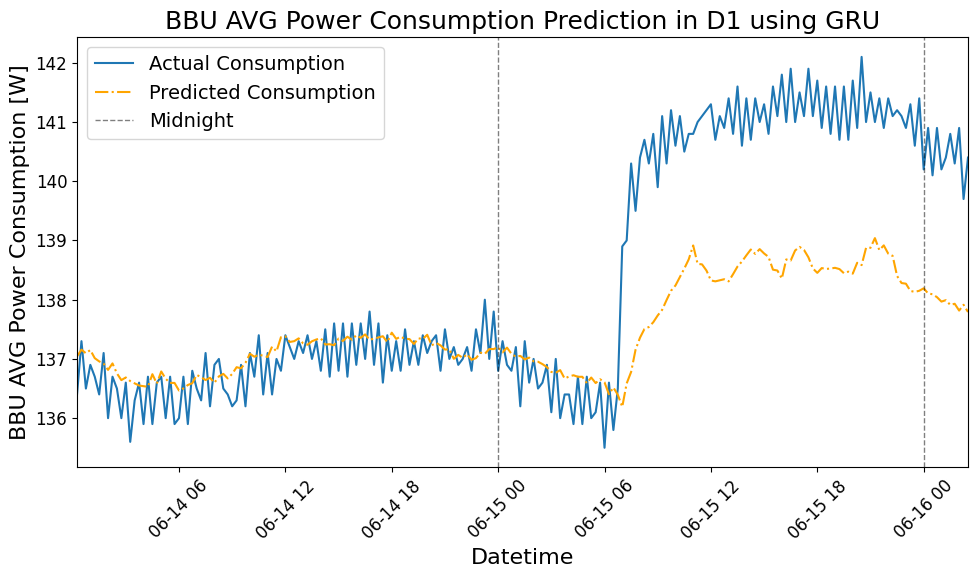

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


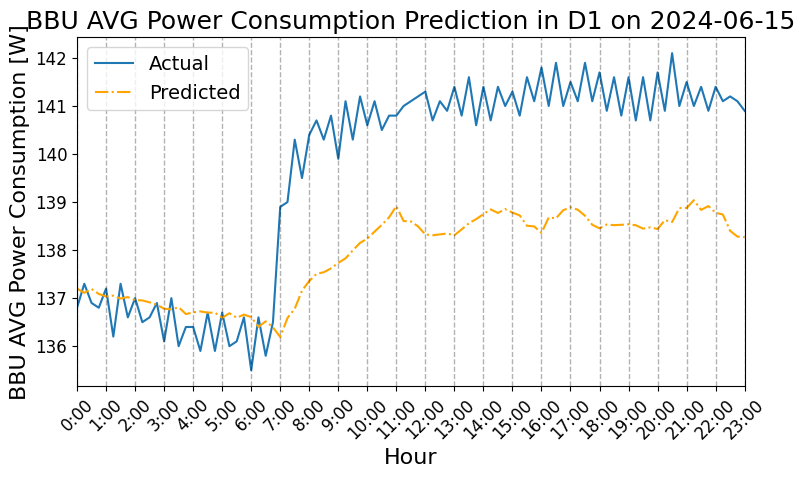

In [43]:
model_perform("delta", ["D1"], "GRU")

### Result of D2

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3541 - val_loss: 0.1277 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1562 - val_loss: 0.0814 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0934 - val_loss: 0.0643 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0877 - val_loss: 0.0660 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0811 - val_loss: 0.0631 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0762 - val_loss: 0.0657 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0738 - val_loss: 0.0658 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0701 - val_loss: 0.0735 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0687 - val_loss: 0.0761 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

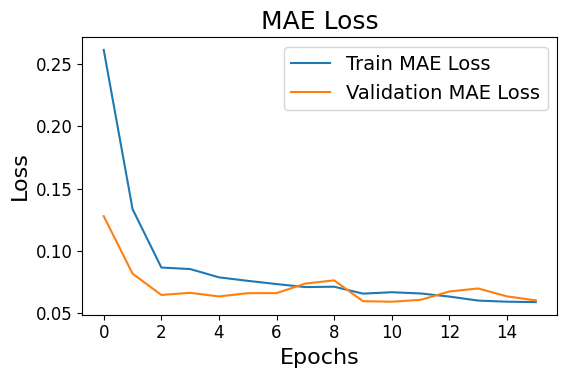

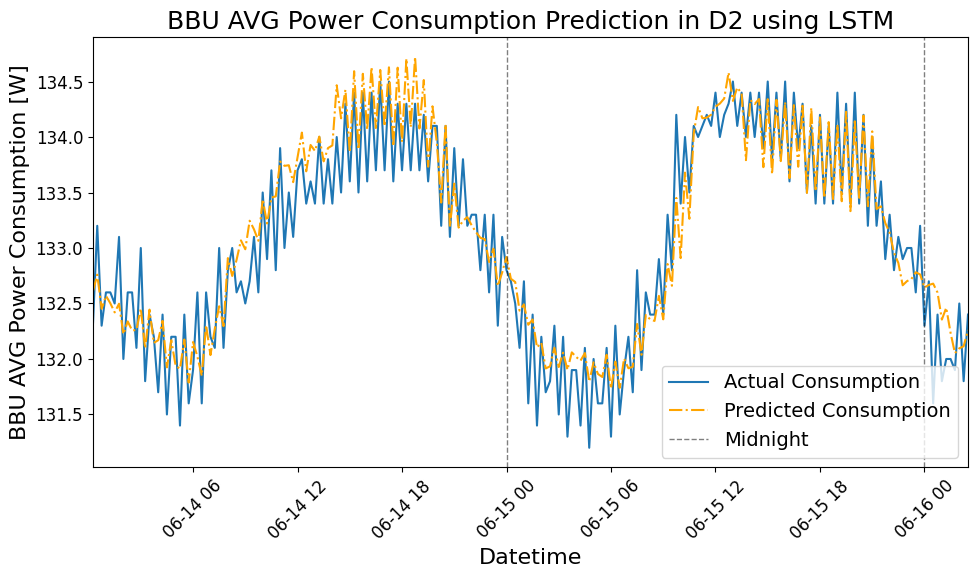

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


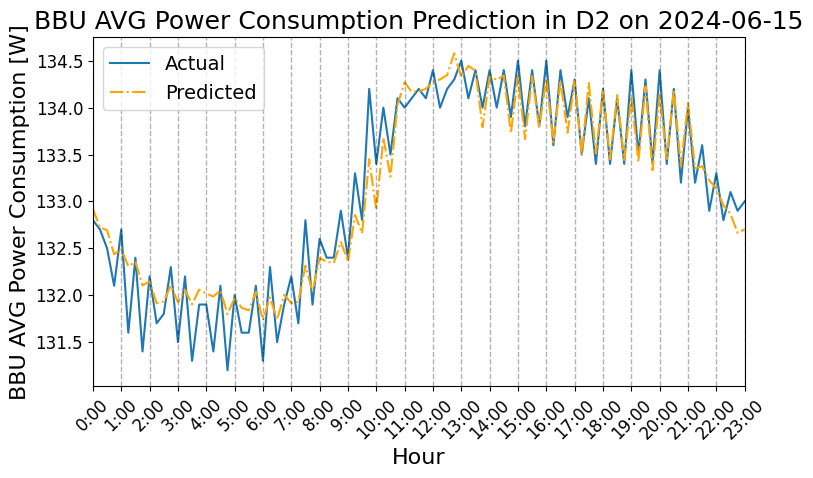

In [56]:
model_perform("delta", ["D2"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3796 - val_loss: 0.1315 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1315 - val_loss: 0.0845 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1097 - val_loss: 0.0768 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0942 - val_loss: 0.0726 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0962 - val_loss: 0.0737 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0982 - val_loss: 0.0692 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0851 - val_loss: 0.0688 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0820 - val_loss: 0.0621 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0731 - val_loss: 0.0815 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

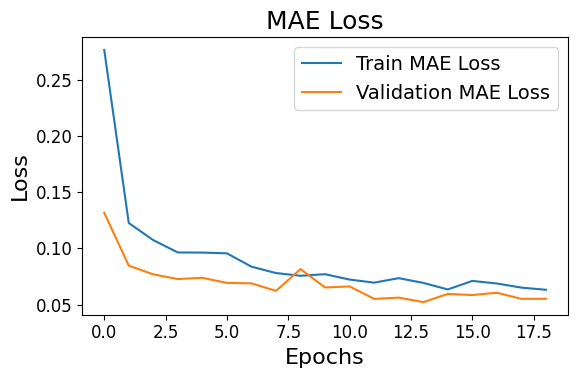

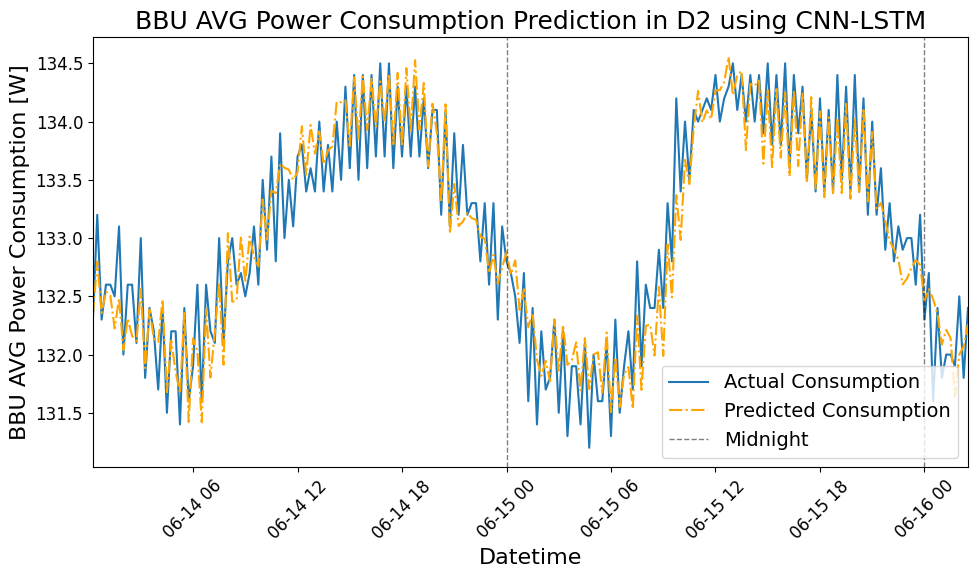

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


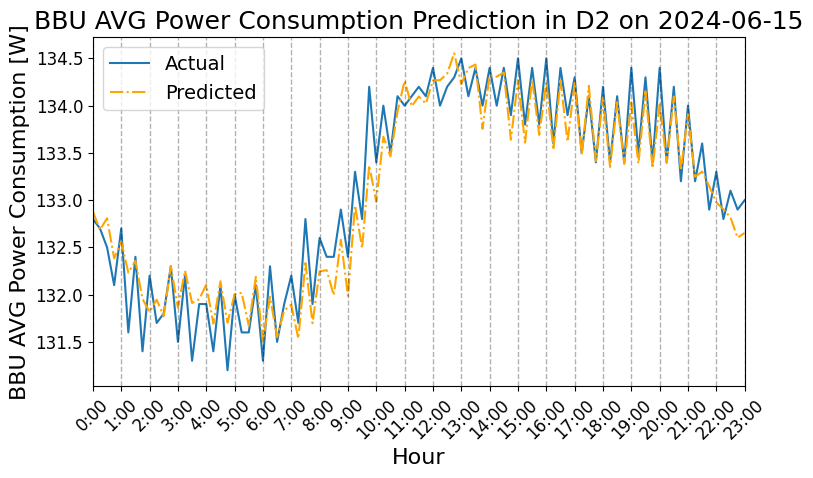

In [61]:
model_perform("delta", ["D2"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

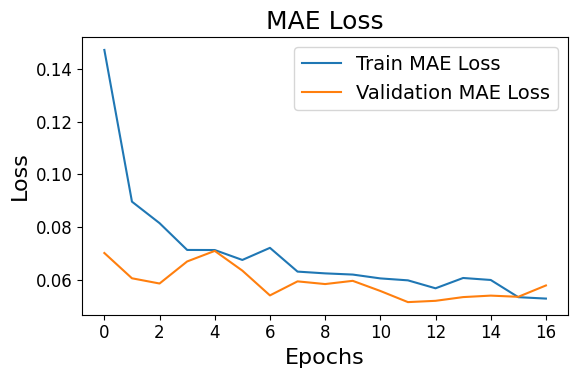

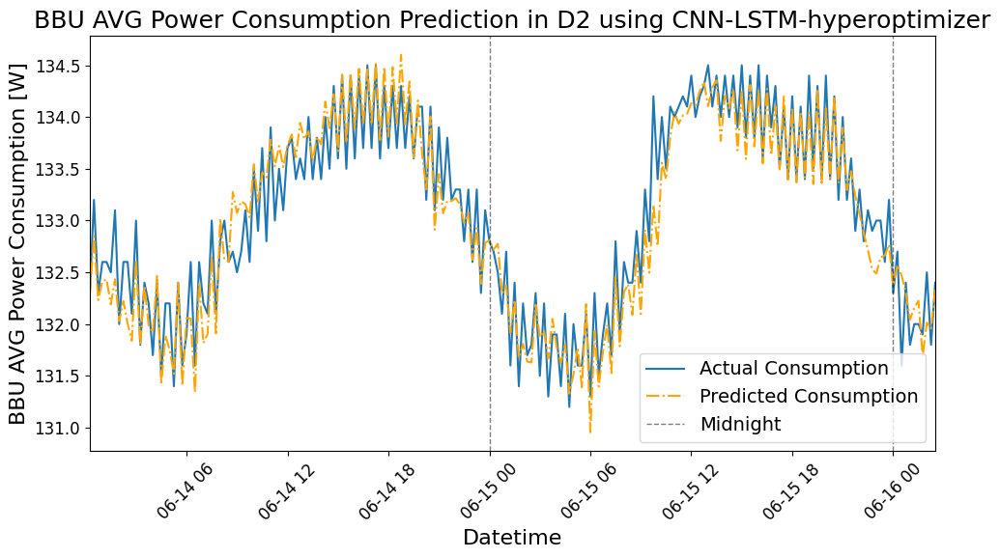

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


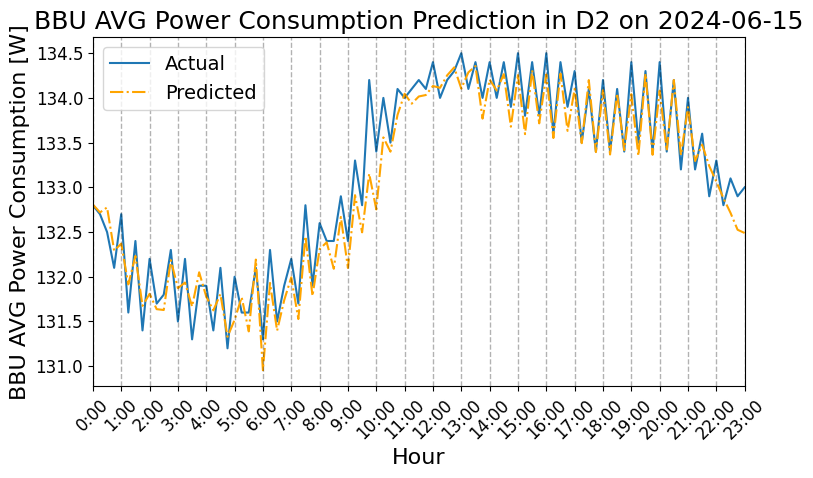

In [48]:
model_perform("delta", ["D2"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3968 - val_loss: 0.1442 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1278 - val_loss: 0.0807 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1047 - val_loss: 0.0720 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0942 - val_loss: 0.0738 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0941 - val_loss: 0.0775 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0944 - val_loss: 0.0692 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0934 - val_loss: 0.0667 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0893 - val_loss: 0.0642 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0829 - val_loss: 0.0610 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

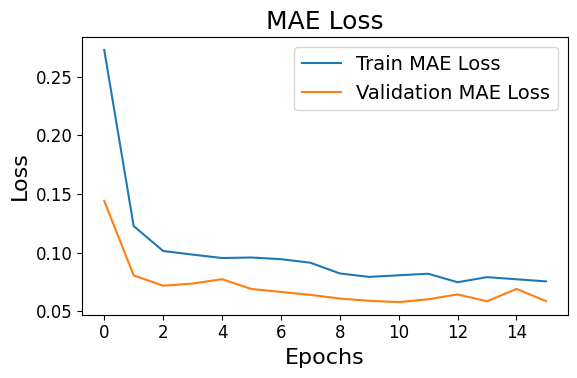

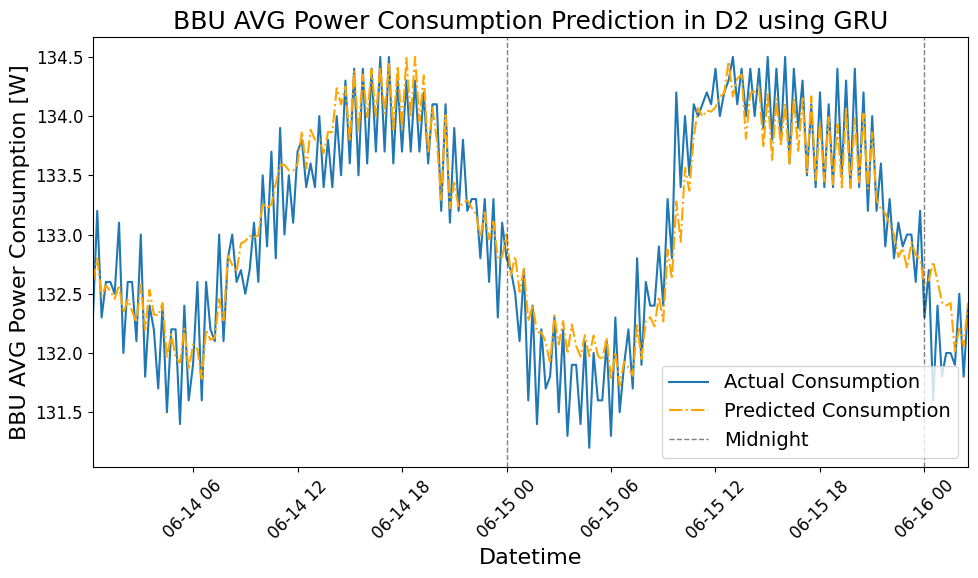

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


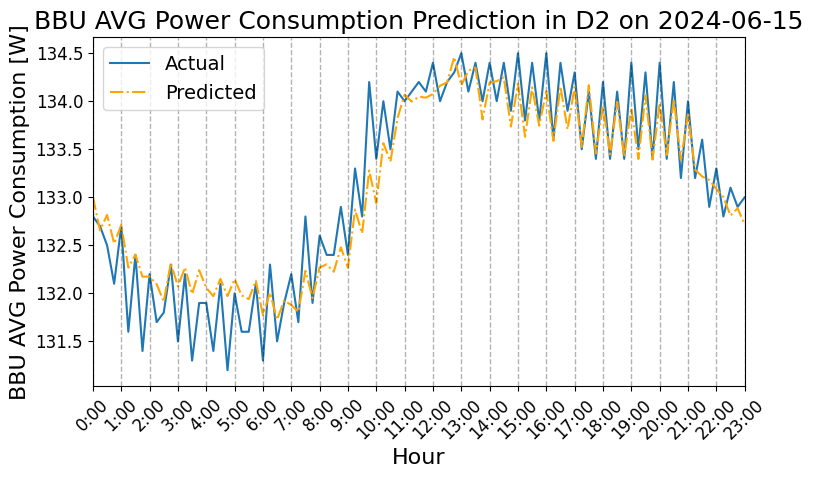

In [54]:
model_perform("delta", ["D2"], "GRU")

### Result of D3

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4107 - val_loss: 0.1442 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1417 - val_loss: 0.1263 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1175 - val_loss: 0.1175 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1081 - val_loss: 0.1050 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0974 - val_loss: 0.0955 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0886 - val_loss: 0.0793 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0780 - val_loss: 0.0676 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0763 - val_loss: 0.0659 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0724 - val_loss: 0.0647 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

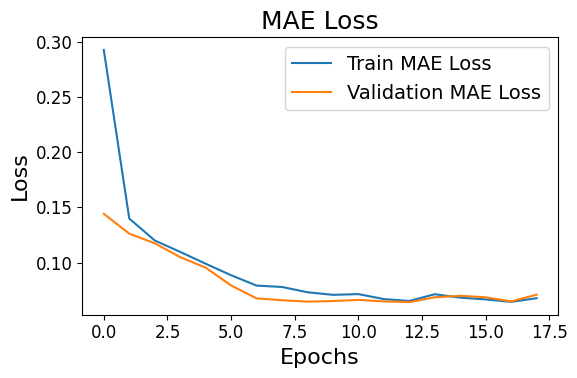

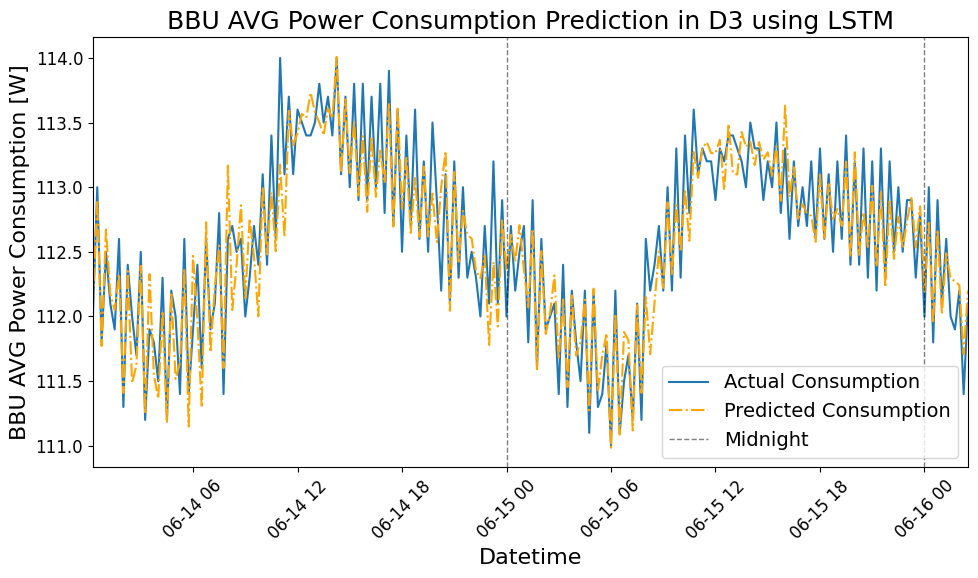

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


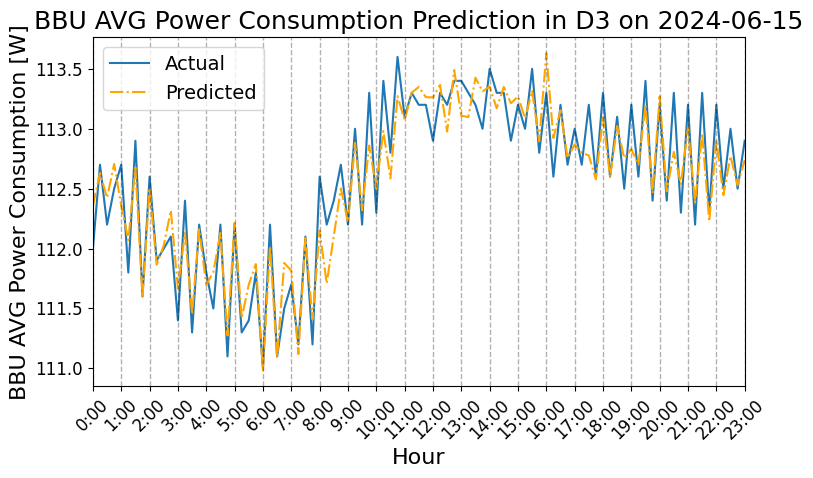

In [67]:
model_perform("delta", ["D3"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.4521 - val_loss: 0.1523 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1583 - val_loss: 0.1183 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1466 - val_loss: 0.1106 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1218 - val_loss: 0.0988 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1161 - val_loss: 0.0944 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1162 - val_loss: 0.0859 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1062 - val_loss: 0.0808 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0999 - val_loss: 0.0764 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0980 - val_loss: 0.0752 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

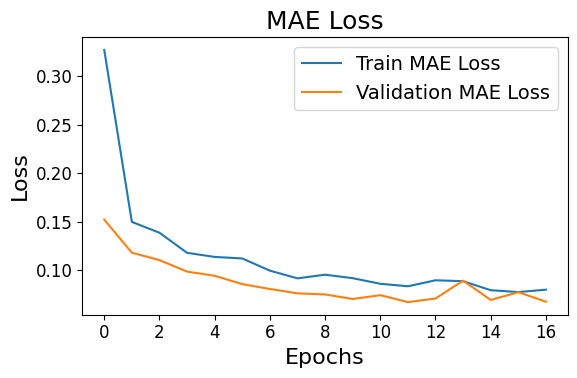

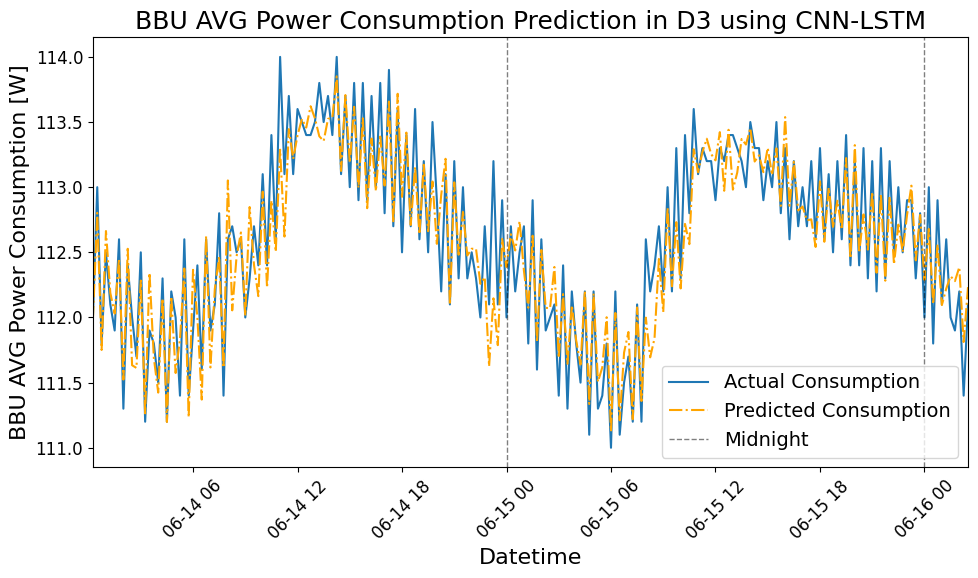

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


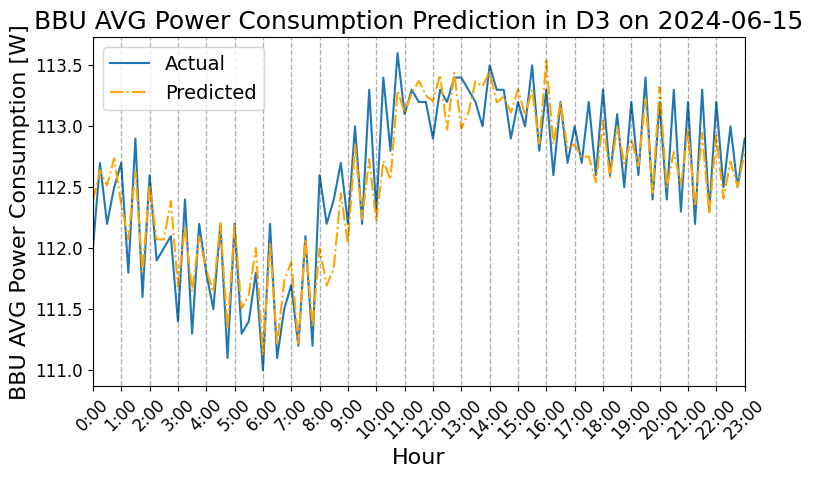

In [63]:
model_perform("delta", ["D3"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

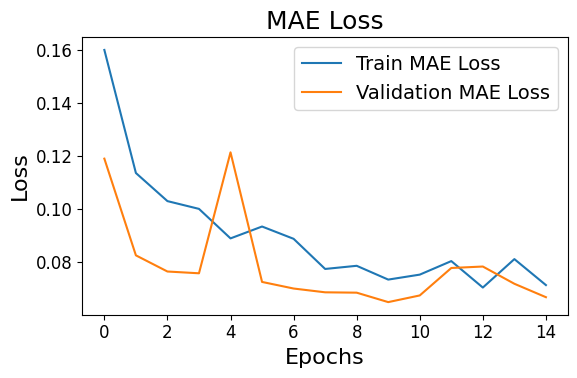

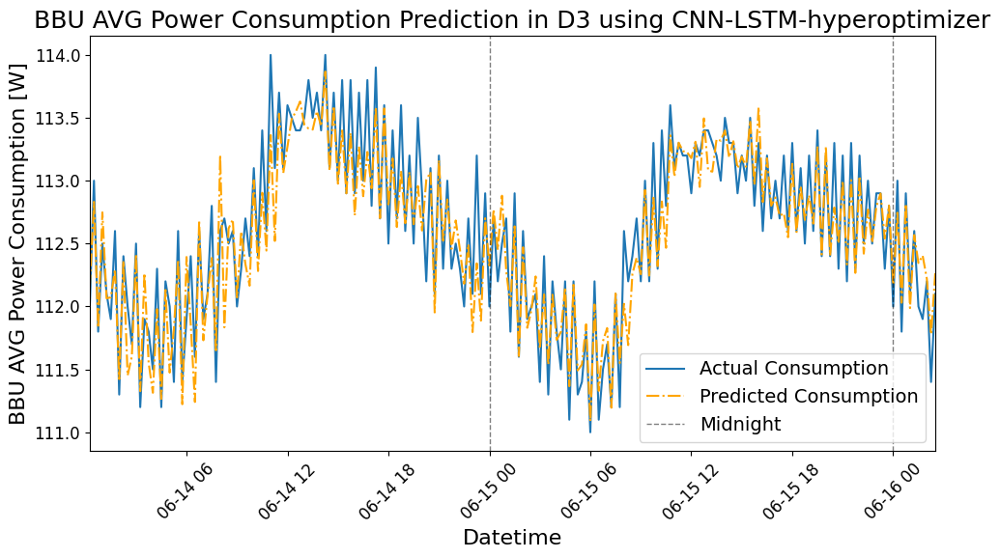

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


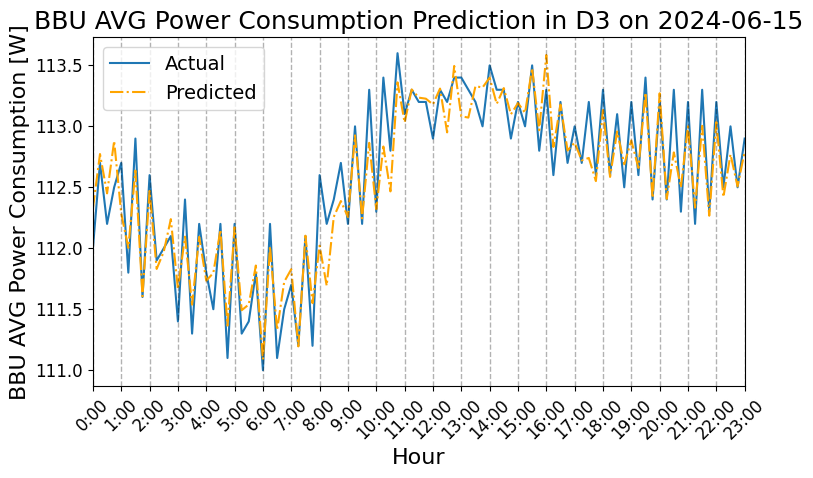

In [64]:
model_perform("delta", ["D3"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3692 - val_loss: 0.1327 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1411 - val_loss: 0.1268 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1254 - val_loss: 0.1196 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1202 - val_loss: 0.1140 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1245 - val_loss: 0.1095 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1139 - val_loss: 0.1057 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1236 - val_loss: 0.1171 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1214 - val_loss: 0.1023 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1064 - val_loss: 0.0941 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

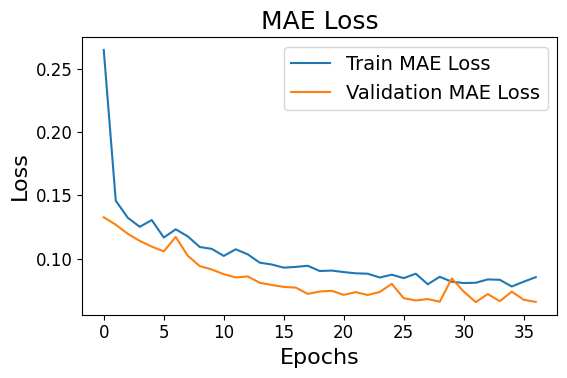

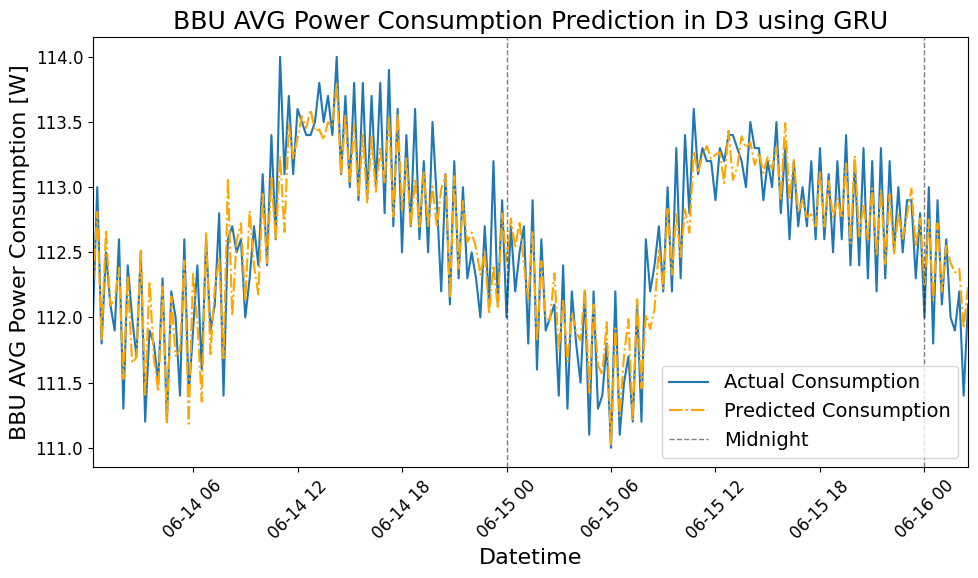

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


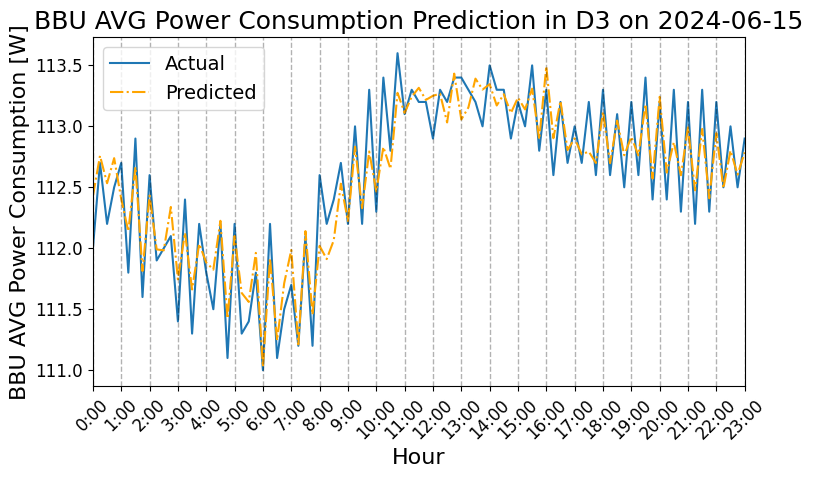

In [68]:
model_perform("delta", ["D3"], "GRU")

## Results of BBU AVG Power Consumption for Gamma Site (G1, G2, G3)

### Result of G1

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2236 - val_loss: 0.0924 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0458 - val_loss: 0.0571 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0389 - val_loss: 0.0660 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0331 - val_loss: 0.0545 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0301 - val_loss: 0.0527 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0288 - val_loss: 0.0529 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0261 - val_loss: 0.0571 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0257 - val_loss: 0.0532 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0247 - val_loss: 0.0553 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

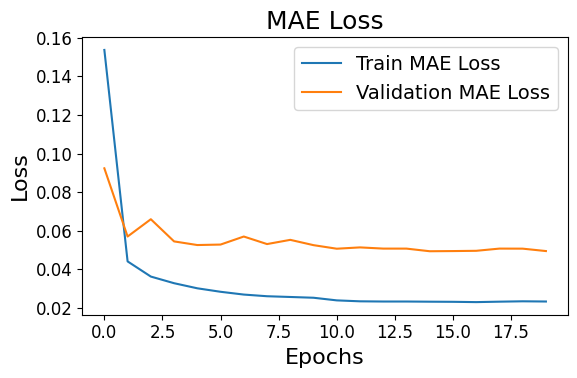

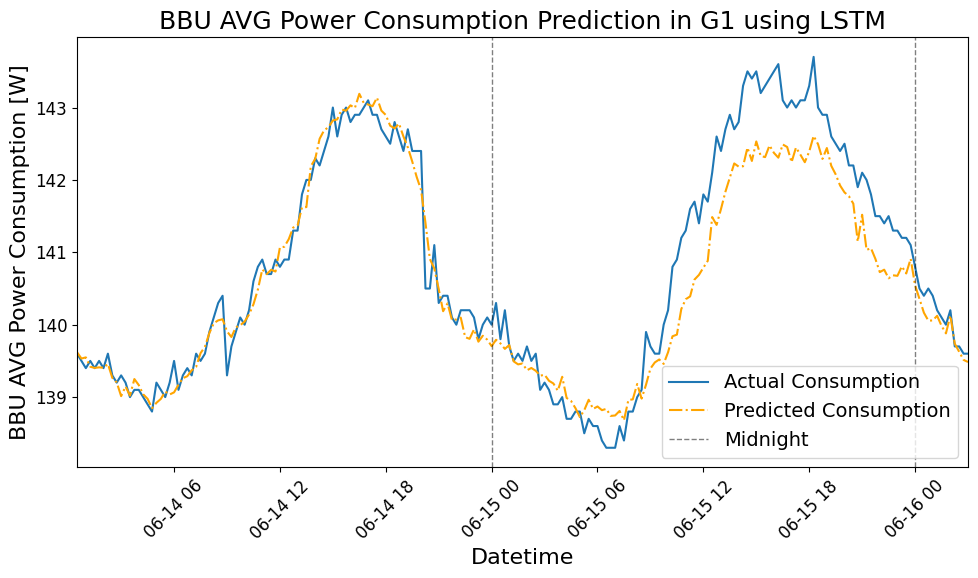

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


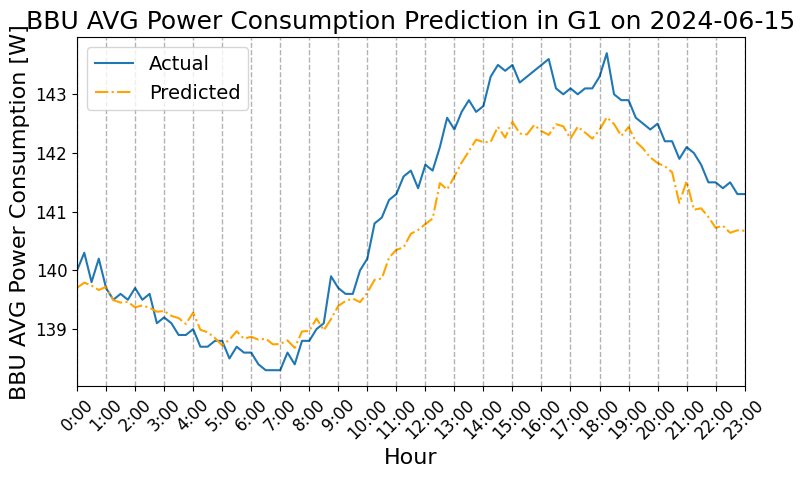

In [70]:
model_perform("gama", ["G1"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2778 - val_loss: 0.0854 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0744 - val_loss: 0.0705 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0489 - val_loss: 0.0824 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0444 - val_loss: 0.0647 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0440 - val_loss: 0.0773 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0453 - val_loss: 0.0657 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0402 - val_loss: 0.0609 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0417 - val_loss: 0.0569 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0415 - val_loss: 0.0644 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

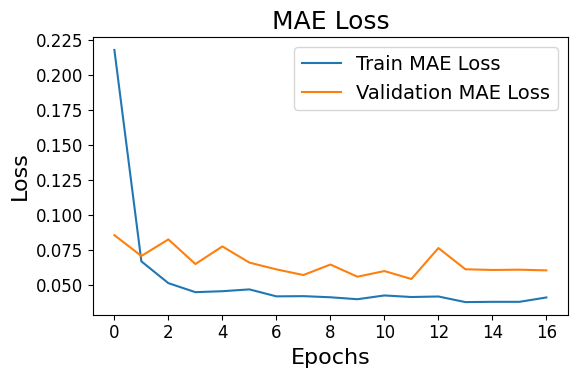

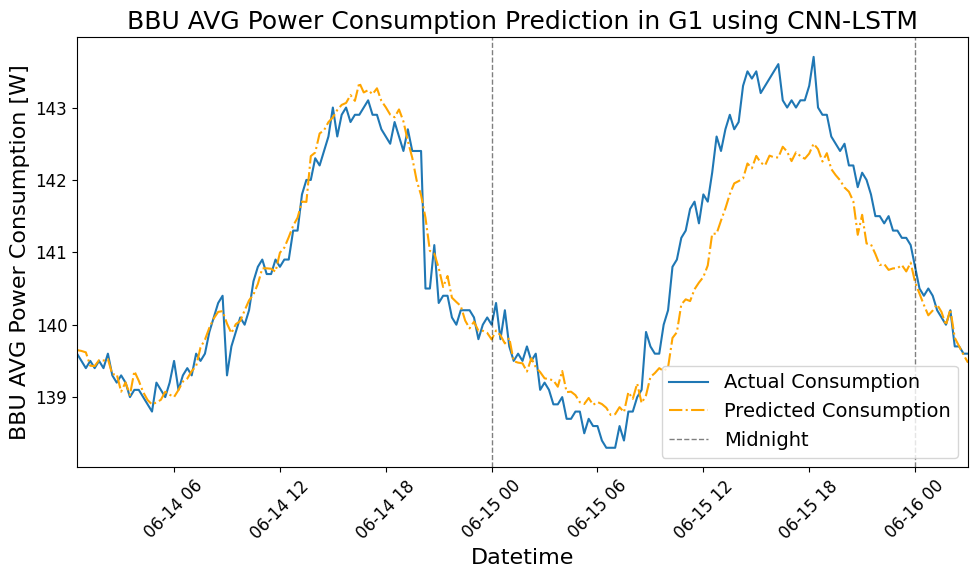

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


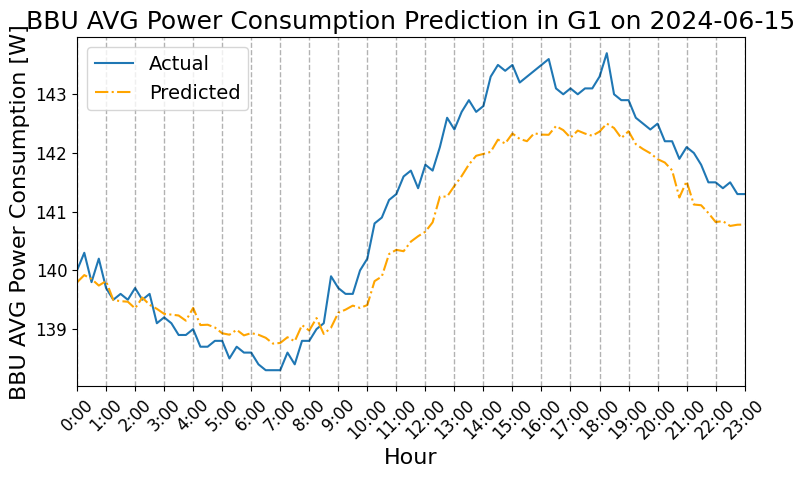

In [71]:
model_perform("gama", ["G1"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

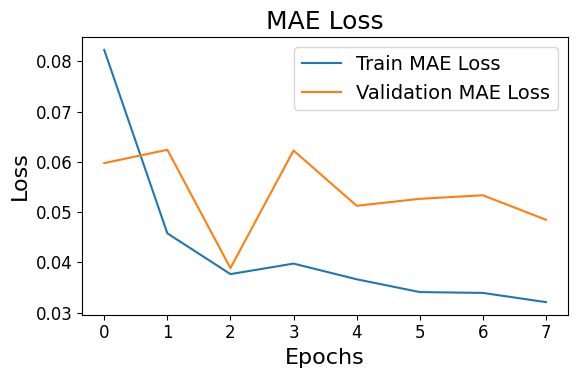

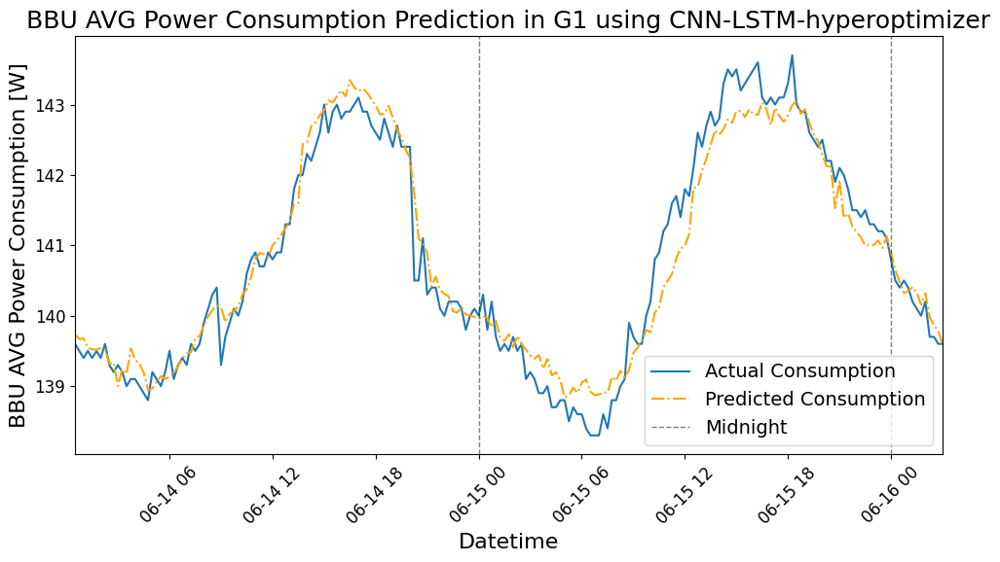

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


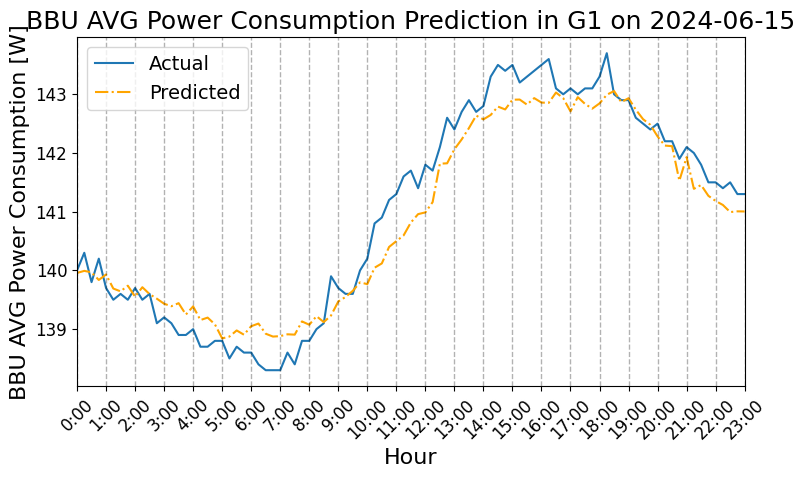

In [72]:
model_perform("gama", ["G1"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.1988 - val_loss: 0.0696 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0685 - val_loss: 0.0626 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0538 - val_loss: 0.0693 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0508 - val_loss: 0.0588 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0470 - val_loss: 0.0626 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0498 - val_loss: 0.0648 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0448 - val_loss: 0.0650 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0444 - val_loss: 0.0596 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0454 - val_loss: 0.0549 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

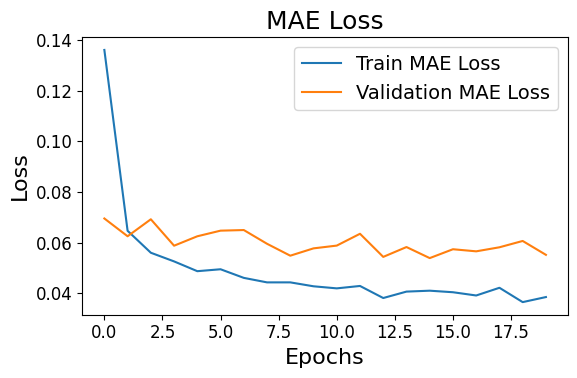

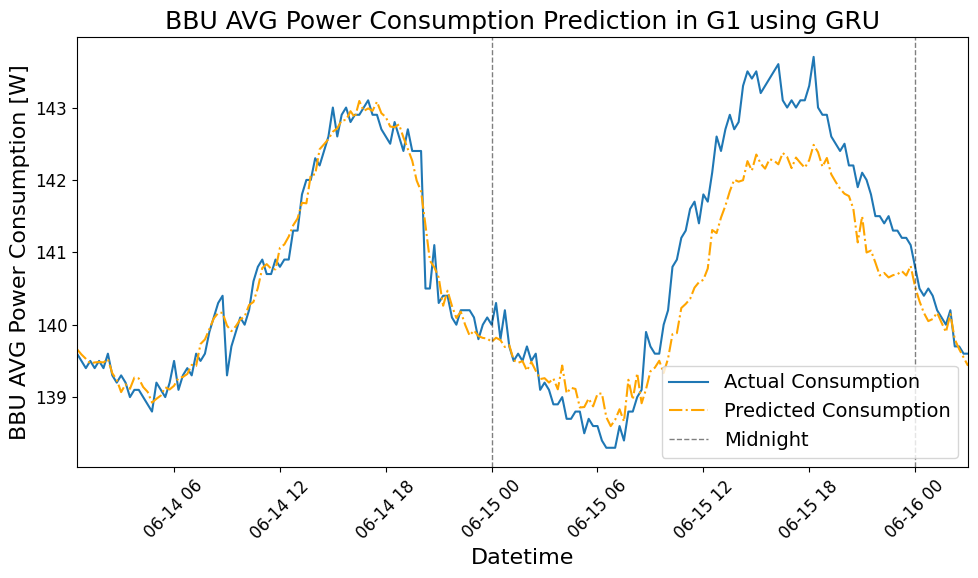

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


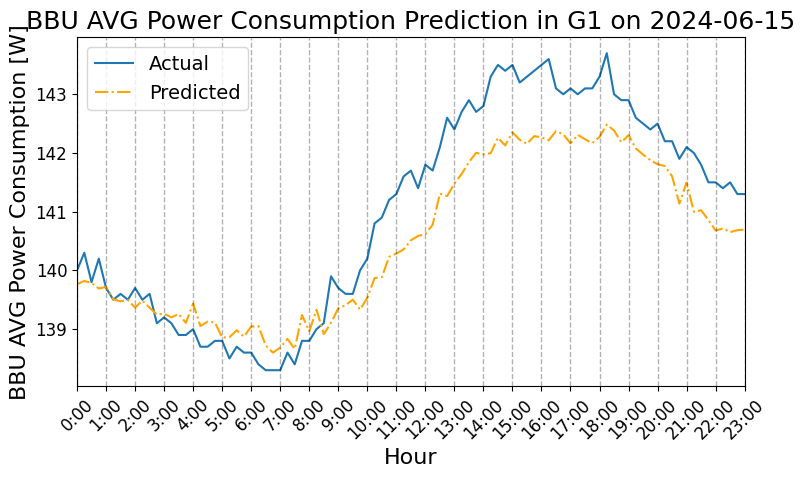

In [73]:
model_perform("gama", ["G1"], "GRU")

### Result of G2

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2726 - val_loss: 0.1721 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0769 - val_loss: 0.0712 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0343 - val_loss: 0.0748 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0323 - val_loss: 0.0783 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0297 - val_loss: 0.0777 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0259 - val_loss: 0.0710 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0248 - val_loss: 0.0734 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0254 - val_loss: 0.0771 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0240 - val_loss: 0.0737 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

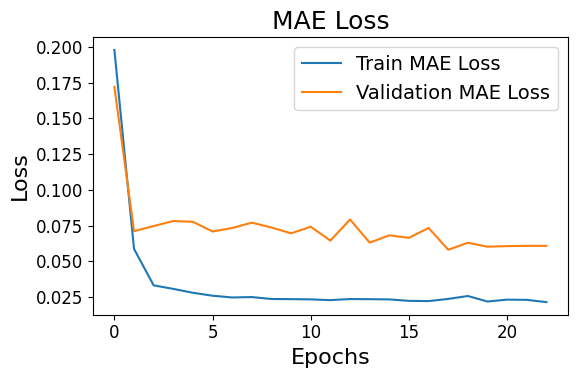

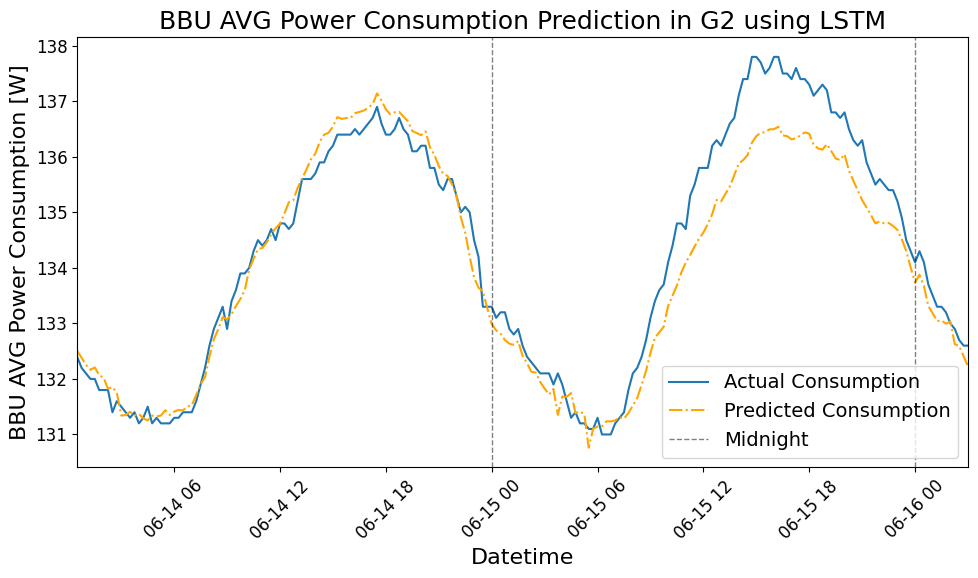

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


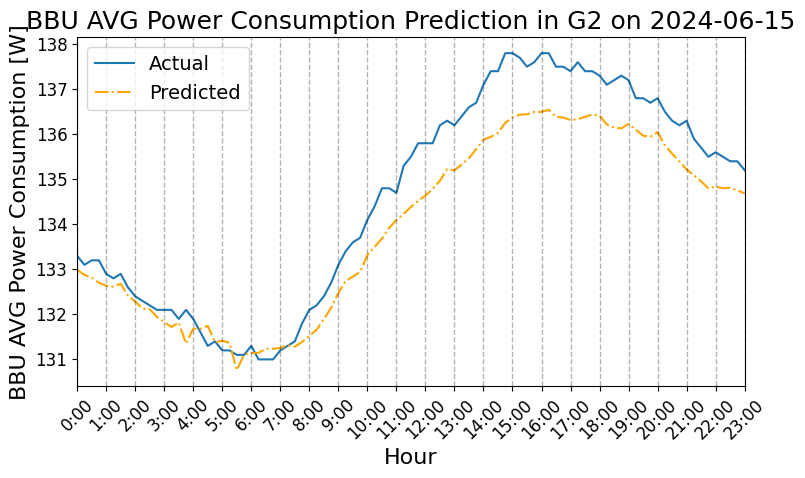

In [75]:
model_perform("gama", ["G2"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3234 - val_loss: 0.0803 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0851 - val_loss: 0.0779 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0564 - val_loss: 0.0835 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0435 - val_loss: 0.0751 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0479 - val_loss: 0.0796 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0451 - val_loss: 0.0808 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0475 - val_loss: 0.1023 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0476 - val_loss: 0.0849 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0445 - val_loss: 0.0934 - learning_rate: 0.0010
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6

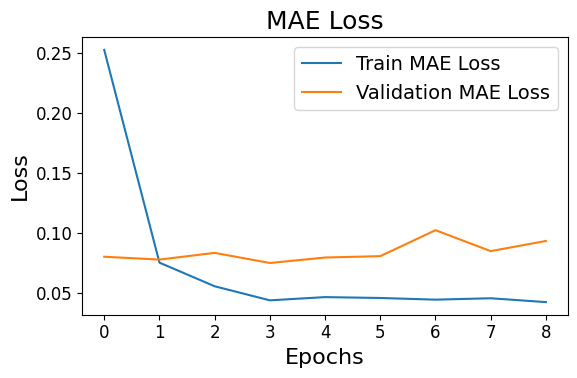

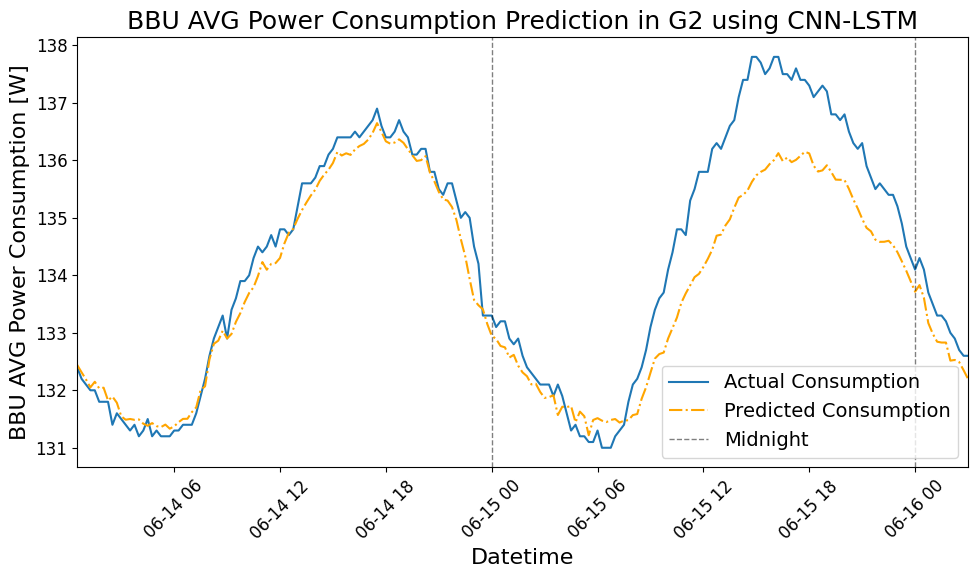

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


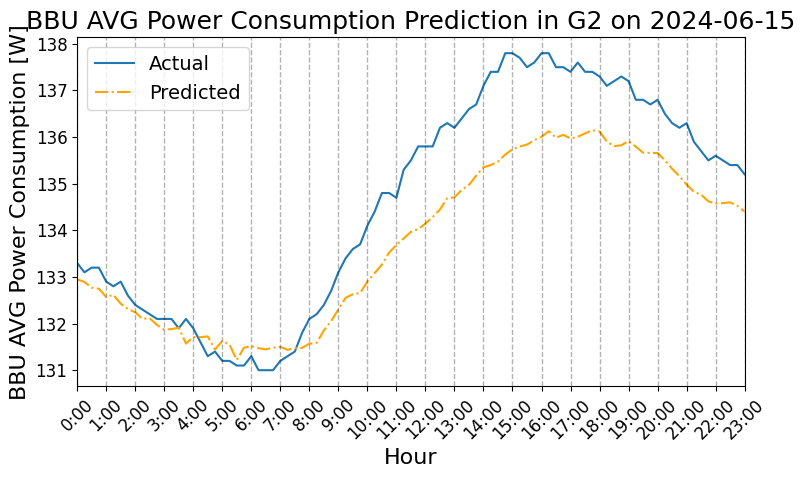

In [76]:
model_perform("gama", ["G2"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

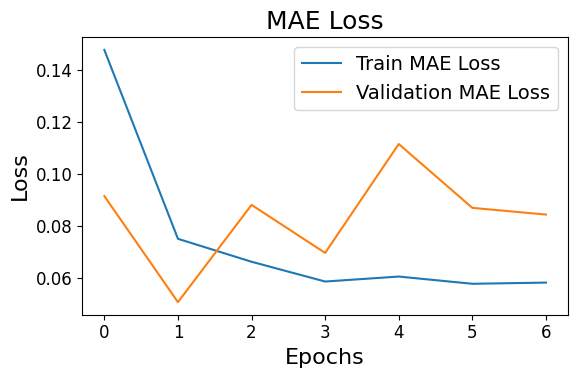

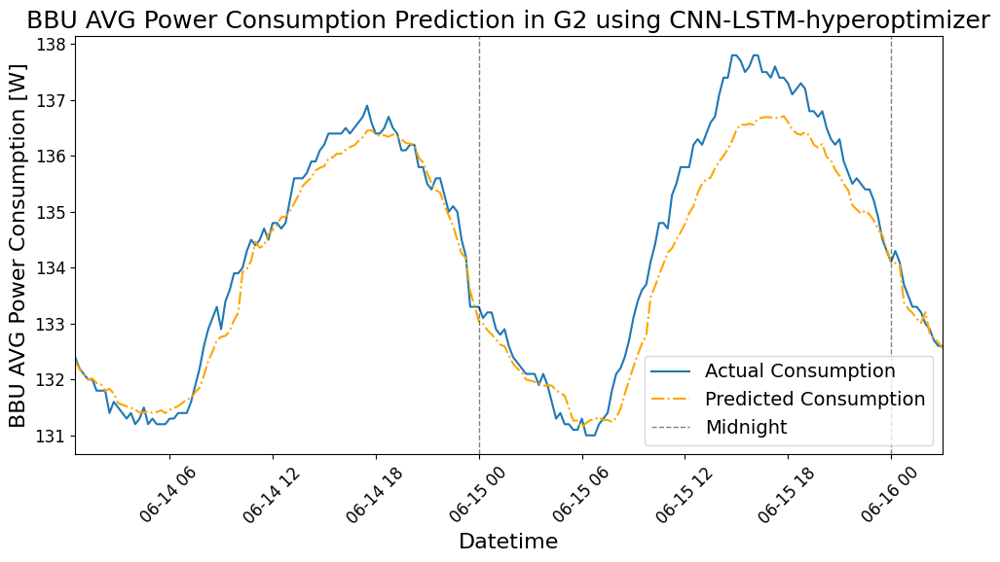

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


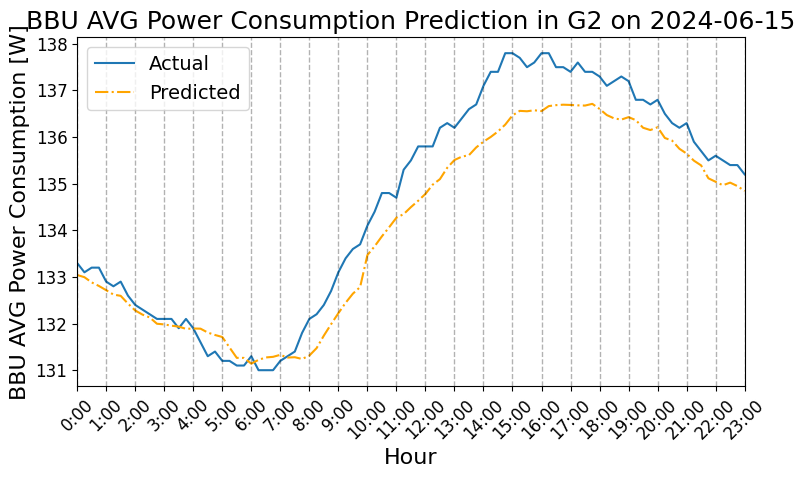

In [79]:
model_perform("gama", ["G2"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2231 - val_loss: 0.0732 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0787 - val_loss: 0.1045 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0591 - val_loss: 0.1136 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0555 - val_loss: 0.0933 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0511 - val_loss: 0.1063 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0506 - val_loss: 0.0920 - learning_rate: 0.0010
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step
Train MAE: 0.4496455036657378, Train MAPE: 0.3362964088935278%
Test MAE: 0.5634806966546723, Test MAPE: 0.4185154017307601%


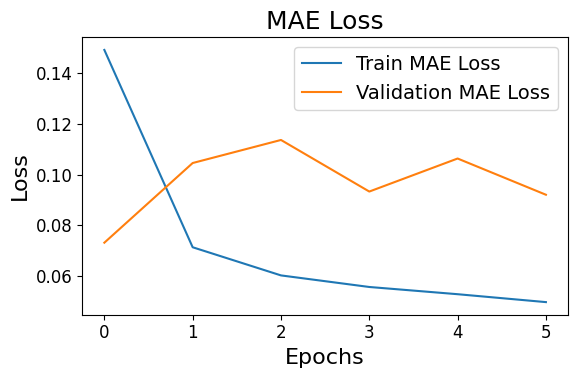

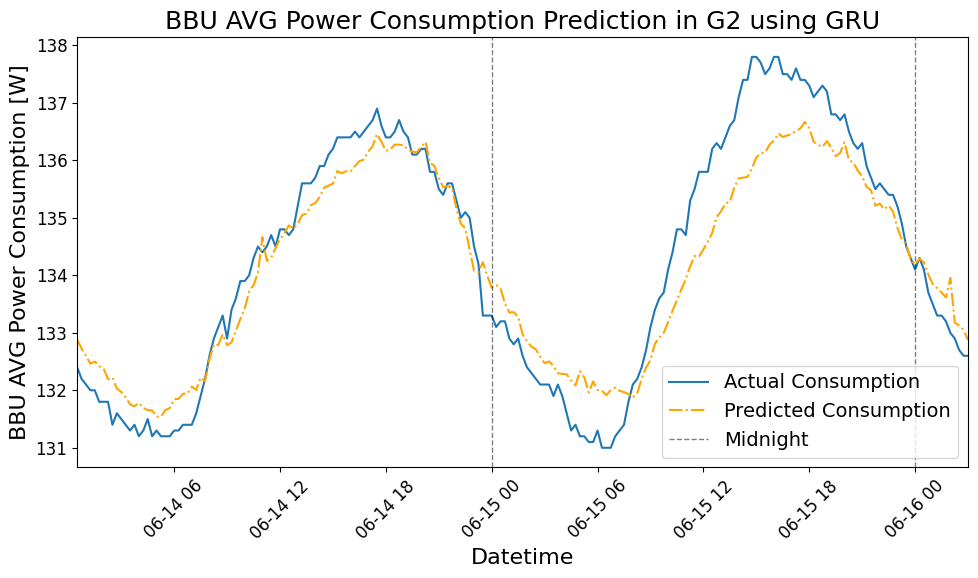

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


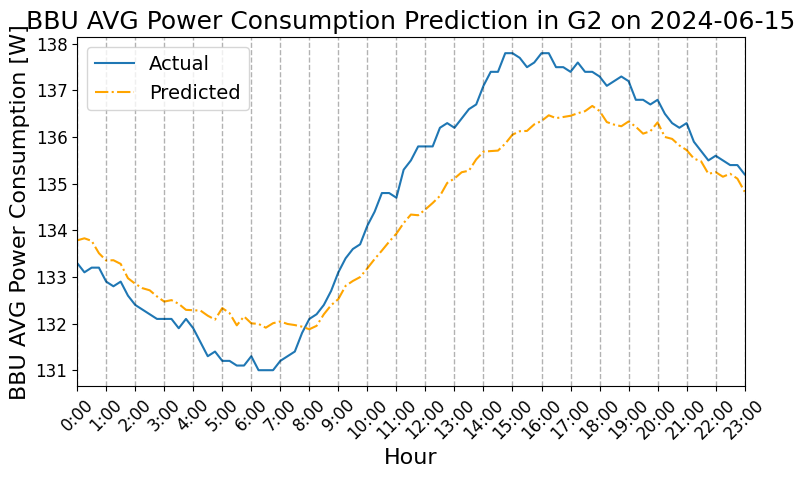

In [77]:
model_perform("gama", ["G2"], "GRU")

### Result of G3

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2769 - val_loss: 0.1178 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.1098 - val_loss: 0.0622 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0652 - val_loss: 0.0448 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0505 - val_loss: 0.0345 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0381 - val_loss: 0.0382 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0328 - val_loss: 0.0567 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0374 - val_loss: 0.0315 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0364 - val_loss: 0.0243 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0308 - val_loss: 0.0391 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

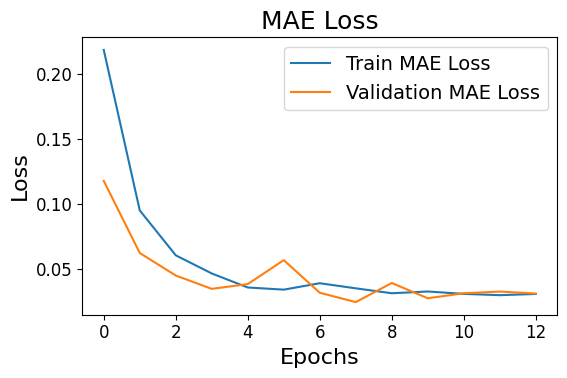

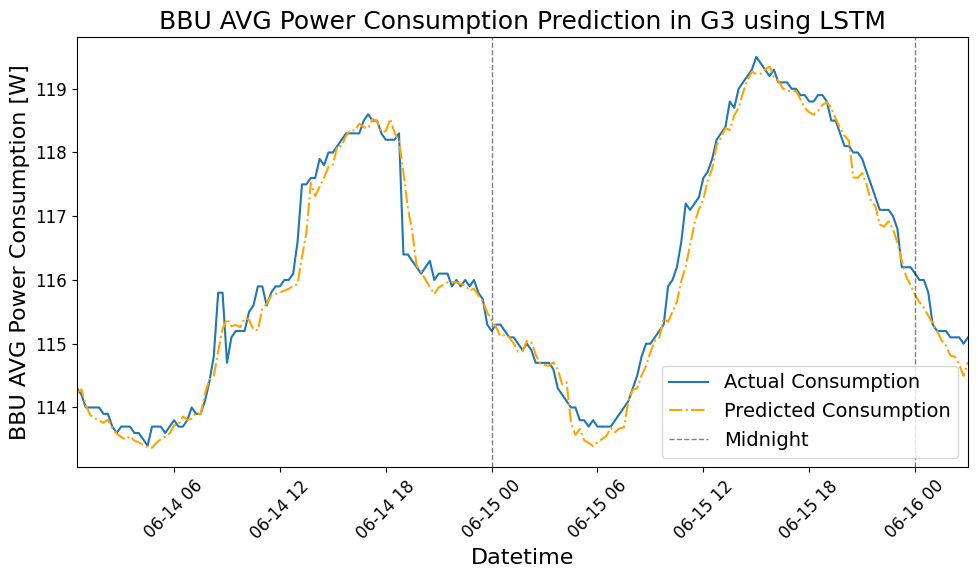

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


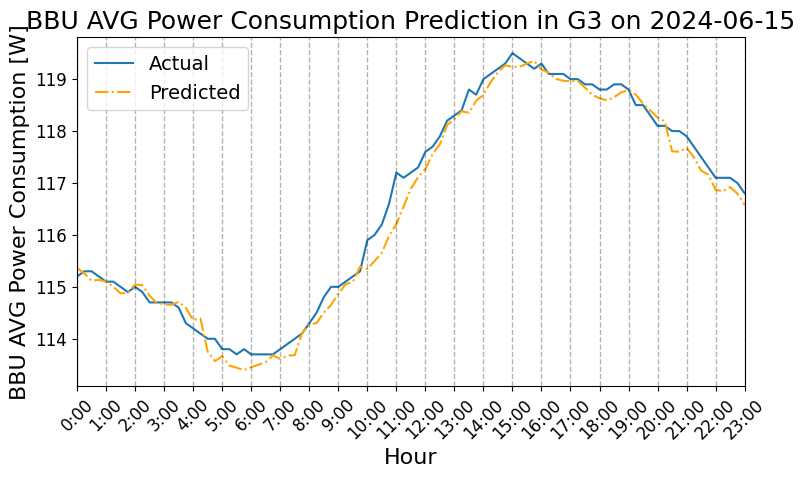

In [86]:
model_perform("gama", ["G3"], "LSTM")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.2826 - val_loss: 0.1014 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1067 - val_loss: 0.0428 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0738 - val_loss: 0.0488 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0601 - val_loss: 0.0710 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0595 - val_loss: 0.0436 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0539 - val_loss: 0.0364 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0556 - val_loss: 0.0367 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0499 - val_loss: 0.0516 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0501 - val_loss: 0.0434 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

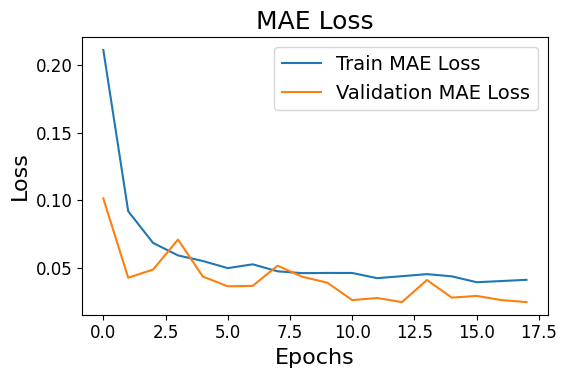

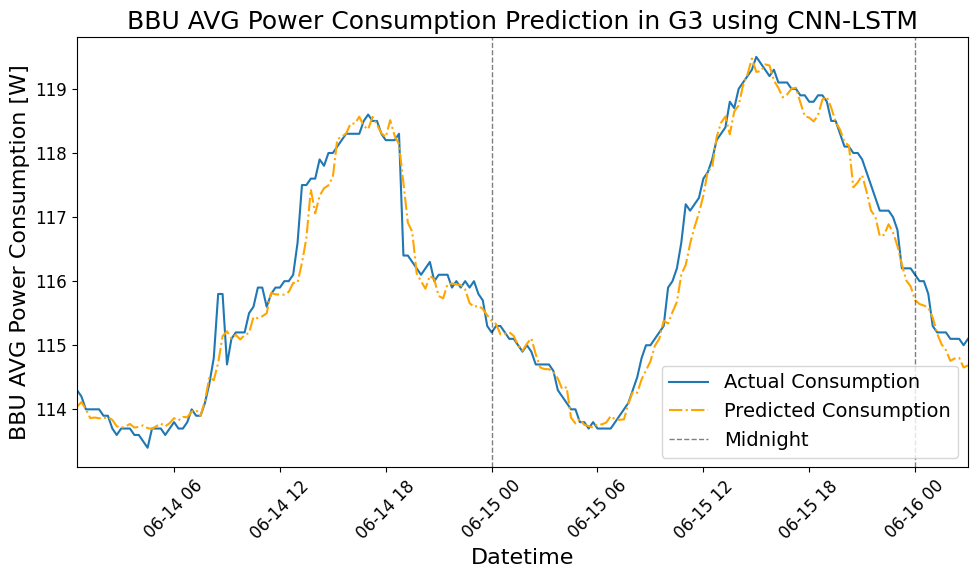

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


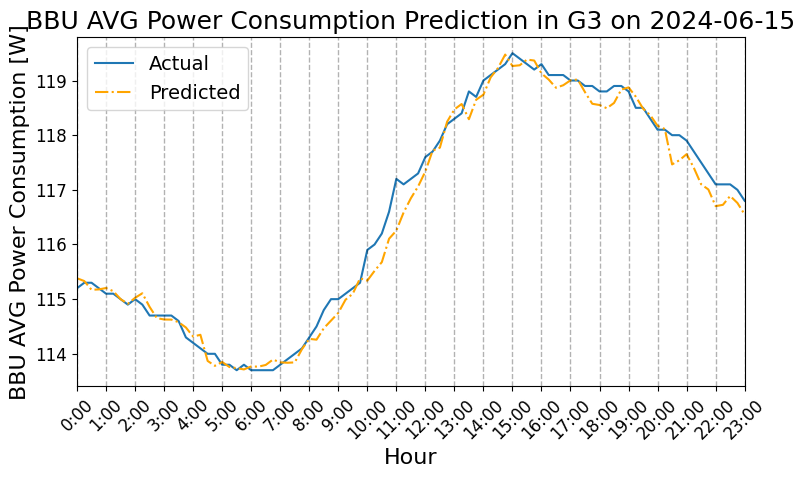

In [82]:
model_perform("gama", ["G3"], "CNN-LSTM")

Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.46517798764178464, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0062391780769987465, 'lstm_units': 50, 'pool_size': 1}
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



Testing with parameters: {'activation': 'relu', 'batch_size': 64, 'dropout': 0.4582791445740304, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.006121666705494253, 'lstm_units': 150, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.38529825538190093, 'filters': 16, 'kernel_size': 1, 'learning_rate': 0.0008292441519601888, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 16, 'dropout': 0.37773602399774225, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0022009494582340187, 'lstm_units': 100, 'pool_size': 1}
Testing with parameters: {'activation': 'relu', 'batch_size': 32, 'dropout': 0.28620689595597015, 'filters': 32, 'kernel_size': 1, 'learning_rate': 0.0010567819922023907, 'lstm_units': 50, 'pool_size': 1}
Testing with parameters: {'activation': 'tanh', 'batch_size': 32, 'dropout': 0.332583019505736, 'filters': 64, 'kernel_size': 1, 'learning_rate': 0.0016941386753130934, 'lstm_units

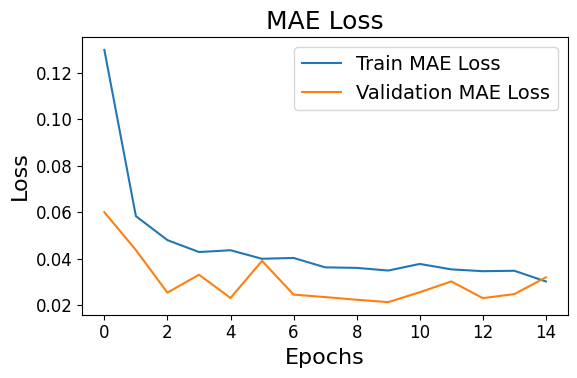

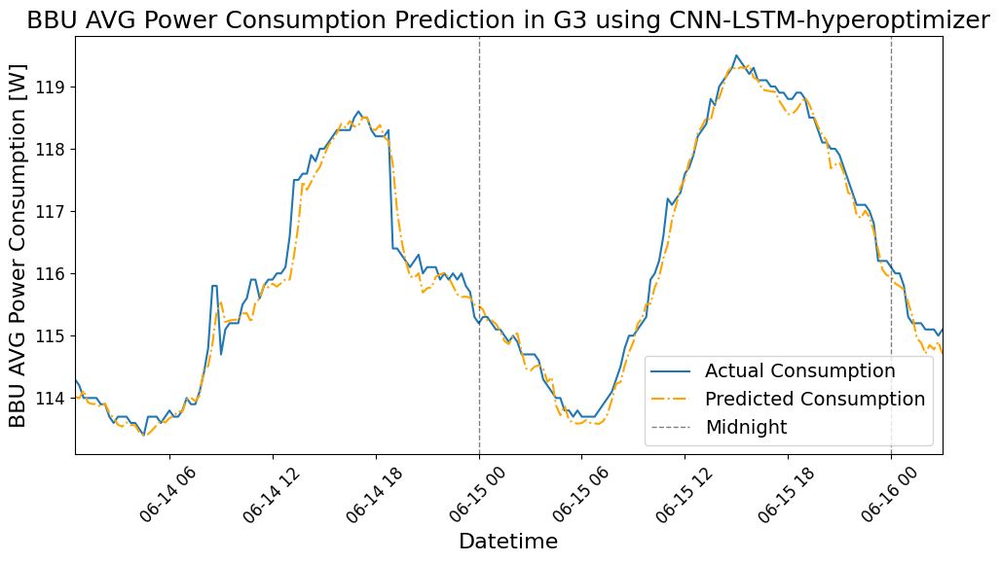

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


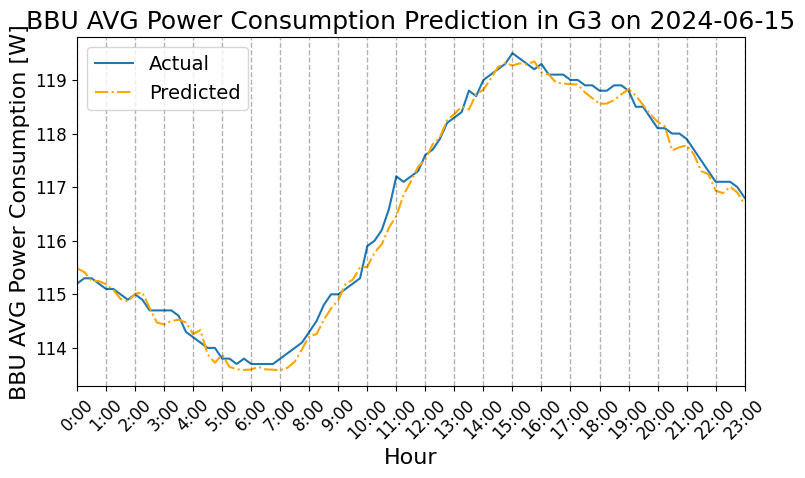

In [87]:
model_perform("gama", ["G3"], "CNN-LSTM-hyperoptimizer")

Epoch 1/100


C:\Users\Viet Anh Phan\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.2575 - val_loss: 0.0959 - learning_rate: 0.0010
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0998 - val_loss: 0.0493 - learning_rate: 0.0010
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0784 - val_loss: 0.0441 - learning_rate: 0.0010
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0725 - val_loss: 0.0345 - learning_rate: 0.0010
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0662 - val_loss: 0.0318 - learning_rate: 0.0010
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0669 - val_loss: 0.0375 - learning_rate: 0.0010
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0570 - val_loss: 0.0280 - learning_rate: 0.0010
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0547 - val_loss: 0.0266 - learning_rate: 0.0010
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0520 - val_loss: 0.0333 - learning_rate: 0.0010
Epoch 10/100
30/30 ━━━━━━━━━━━━

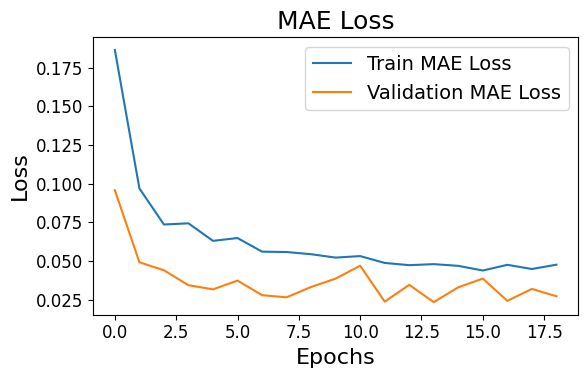

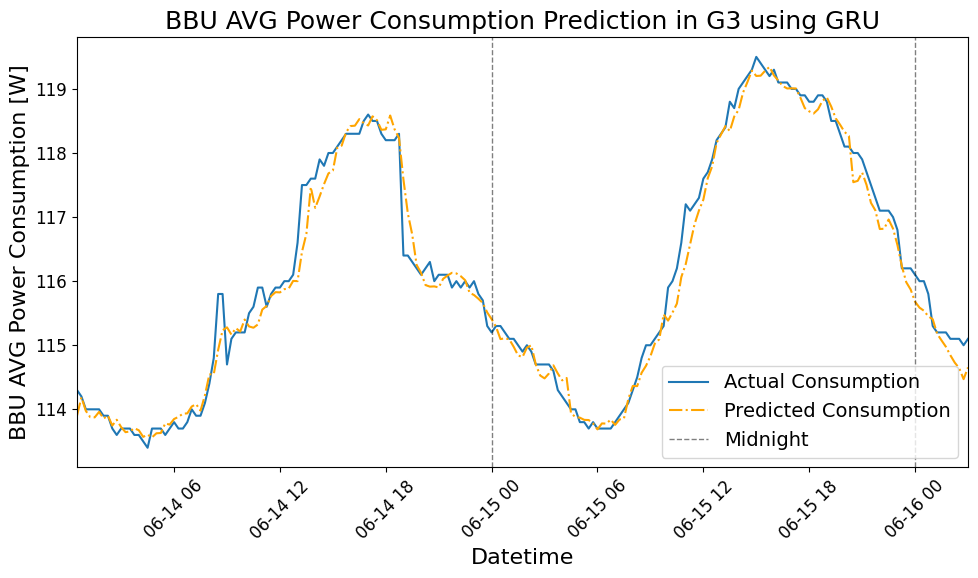

C:\Users\Viet Anh Phan\AppData\Local\Temp\ipykernel_40360\474902361.py:105: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start=start_date, end=end_date, freq='H')


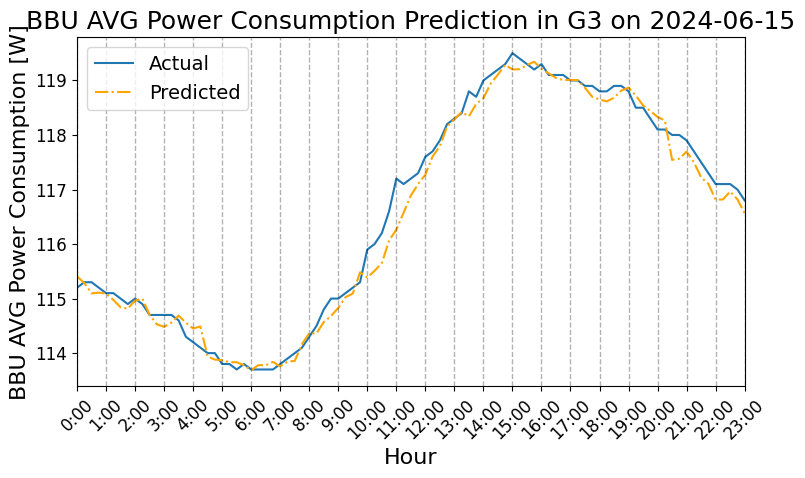

In [88]:
model_perform("gama", ["G3"], "GRU")

## Results of cumulative MAE and MAPE in different models

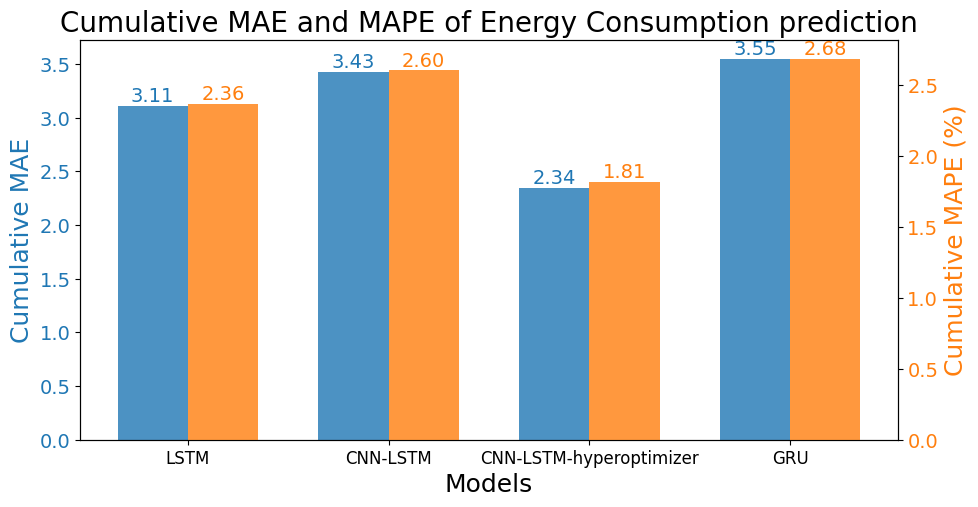

In [91]:
import os
def plot_cumulative_metrics():
    """
    Plot cumulative MAE and MAPE for different models across all sites (beta, delta, gamma).
    """
    base_path = "."
    sites = ["beta", "delta", "gama"]
    models = ["LSTM", "CNN-LSTM", "CNN-LSTM-hyperoptimizer", "GRU"]
    cumulative_mae = {model: [] for model in models}
    cumulative_mape = {model: [] for model in models}

    for site in sites:
        for model in models:
            site_model_path = os.path.join(base_path, site, model)
            if not os.path.exists(site_model_path):
                print(f"Path does not exist: {site_model_path}")
                continue
            for file_name in os.listdir(site_model_path):
                if file_name.endswith('_results.txt'):
                    results_filepath = os.path.join(site_model_path, file_name)
                    with open(results_filepath, 'r') as file:
                        lines = file.readlines()
                        mae = float(lines[1].split(":")[1].strip().split(",")[0])
                        mape = float(lines[1].split(":")[2].strip().split("%")[0])
                        cumulative_mae[model].append(mae)
                        cumulative_mape[model].append(mape)

    # Calculate cumulative metrics
    cumulative_mae = {model: np.sum(mae_list) for model, mae_list in cumulative_mae.items()}
    cumulative_mape = {model: np.sum(mape_list) for model, mape_list in cumulative_mape.items()}

    # Plot cumulative MAE and MAPE
    fig, ax1 = plt.subplots(figsize=(10, 5))

    bar_width = 0.35
    index = np.arange(len(models))

    bars1 = ax1.bar(index, cumulative_mae.values(), bar_width, color='#1f77b4', alpha=0.8, label='Cumulative MAE')
    ax1.set_xlabel('Models', fontsize=18)
    ax1.set_ylabel('Cumulative MAE', color='#1f77b4', fontsize=18)
    ax1.tick_params(axis='y', labelcolor='#1f77b4', labelsize=14)
    ax1.set_xticks(index + bar_width / 2)
    ax1.set_xticklabels(models, fontsize=12)  # Adjusted fontsize

    ax2 = ax1.twinx()
    bars2 = ax2.bar(index + bar_width, cumulative_mape.values(), bar_width, color='#ff7f0e', alpha=0.8, label='Cumulative MAPE')
    ax2.set_ylabel('Cumulative MAPE (%)', color='#ff7f0e', fontsize=18)
    ax2.tick_params(axis='y', labelcolor='#ff7f0e', labelsize=14)

    # Annotate bars with values
    for bar in bars1:
        height = bar.get_height()
        ax1.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords="offset points", ha='center', fontsize=14, color='#1f77b4')

    for bar in bars2:
        height = bar.get_height()
        ax2.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords="offset points", ha='center', fontsize=14, color='#ff7f0e')

    fig.tight_layout()
    plt.title('Cumulative MAE and MAPE of Energy Consumption prediction', fontsize=20)
    plt.savefig(os.path.join(base_path, 'cumulative_mae_mape.png'), bbox_inches='tight')
    plt.show()

plot_cumulative_metrics()